# Librerias

In [1]:
from utils import *

C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\0_Estatutos\000_EAGLE_FANG\utils.py:8: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# Modelo

In [2]:
# trainer.validate(model=model, dataloaders=val_dataset)

# from PIL import Image
# import requests
from transformers import AutoProcessor, Pix2StructForConditionalGeneration

processor = AutoProcessor.from_pretrained("google/pix2struct-textcaps-base")
# processor = AutoProcessor.from_pretrained("google/pix2struct-base")
model = Pix2StructForConditionalGeneration.from_pretrained("juanivazquez/id_card-pix2struct-model-v2")

# url = "https://www.ilankelman.org/stopsigns/australia.jpg"
# image = Image.open(requests.get(url, stream=True).raw)
# image = dataset['test']['image']
# inputs = processor(images=image, return_tensors="pt")

In [2]:

# dataset_name = "timdettmers/openassistant-guanaco"
# dataset = load_dataset(dataset_name, split="train")

In [12]:
# dataset['text'][2]

# Datos

## fotos familiares

In [3]:
path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\entrenamiento\temp\family_test'

t = cv2.imread(os.path.join(path,os.listdir(path)[1]))
#t

In [4]:
path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\entrenamiento\temp\family_test'
import os
fotos = []
for l in os.listdir(path):
    foto_array = cv2.imread(os.path.join(path,l))
    foto_array = cv2.cvtColor(foto_array,cv2.COLOR_BGR2RGB)
    foto = PIL.Image.fromarray(foto_array)
    inputs = processor(images=foto, return_tensors="pt")
    fotos.append([l,foto_array,foto,inputs])
# plt.imshow(fotos[2][1])

## fotos dataset_huggingface

In [3]:
dataset = load_dataset("juanivazquez/jivb-id_card")
# dataset['train']['image'][0]

  0%|          | 0/2 [00:00<?, ?it/s]

In [10]:
# dataset['train'][0]['image']

# Test

In [9]:
# plt.imshow(fotos[2][1])

In [5]:
rgb = fotos[2][1]
# rgb = cv2.cvtColor(fotos[2][1],cv2.COLOR_BGR2RGB)
rgb = PIL.Image.fromarray(rgb)
rgb

NameError: name 'fotos' is not defined

In [6]:
# caso de ejemplo:
image = dataset['test']['image'][0]
# image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
inputs = processor(images=image, return_tensors="pt")

In [15]:
image = dataset['test']['image']
inputs = processor(images=image, return_tensors="pt")

In [17]:
# generated_ids = model.generate(**inputs, max_new_tokens=50)
# generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
# print(generated_text)

In [7]:
# ejecución de modelo:
# autoregressive generation
inputs = processor(images=fotos[0][2], return_tensors="pt")
generated_ids = model.generate(**inputs, max_new_tokens=50)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_text)

NameError: name 'fotos' is not defined

In [8]:
test = compute(dataset['train']['image'][0])
print(test)

<s_apellido> TOLEDO</s_apellido><s_nombre> NATAI ESMERALDA</s_nombre><s_dni> 52388252</s_dni><s_fecha_nac> 07 MAY/ MAY 2012</s_fecha_nac><s_fecha_emision> 24 JUN/ JUN 2


In [7]:
import time
time.time()

1696095869.9724154

In [14]:
start = time.time()
time.sleep(2)
ex_time = time.time()-start
print(ex_time)

2.0116312503814697


In [15]:
caso = dataset['train']['image'][0].copy()
start = time.time()
compute2(caso)
ex_time = np.round(time.time()-start,1)
print(ex_time)

25.39879322052002


In [ ]:
compute2(caso)

# DEMO

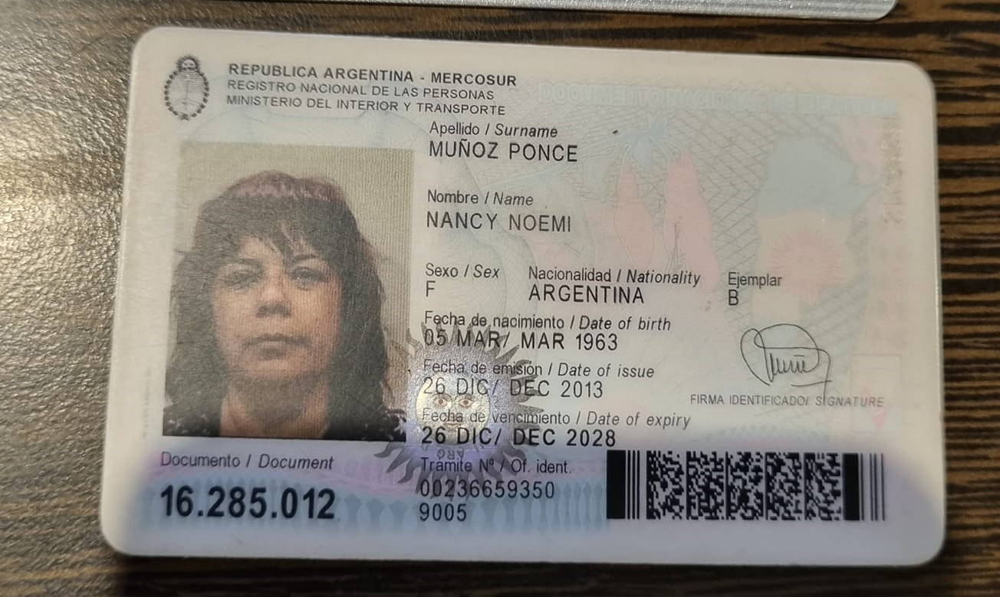

In [44]:
caso = dataset['test']['image'][0].copy()
caso

In [45]:
caso = dataset['test']['image'][0].copy()
start = time.time()
results = compute2(caso)
ex_time = np.round(time.time()-start,1)
results

{'apellido': ' MUNOZ PONCE',
 'nombre': ' NANCY NOEMI',
 'dni': ' 16285012',
 'fecha_nac': ' 05 MAR/ MAR 1963',
 'fecha_emision': '26 DIC/ DEC 2'}

In [46]:
print(ex_time)

30.0


In [22]:
caso = dataset['test']['image'][0].copy()
compute2(caso)

{'apellido': ' MUNOZ PONCE',
 'nombre': ' NANCY NOEMI',
 'dni': ' 16285012',
 'fecha_nac': ' 05 MAR/ MAR 1963',
 'fecha_emision': '26 DIC/ DEC 2'}

In [35]:
type(caso)
caso2 = np.asarray(caso)
rotacion_fina(caso2)

In [72]:
compute3(caso2)

NameError: name 'img' is not defined

In [71]:
def compute3(img):
    ''' 
    infer from model to dict
    '''
    if not type(img)==np.ndarray:
        # img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        # img = PIL.Image.fromarray(img)
        img = np.asarray(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = rotacion_fina(img)
    
    
    if type(img)==np.ndarray:
        # img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = Image.fromarray(img)
        
    inputs = processor(images=img, return_tensors="pt")    
    # run Pix2Struct:
    generated_ids = model.generate(**inputs, max_new_tokens=50)
    texto = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    output = organizar(str([texto]))
    return output

In [40]:
thresh = threshold_otsu(caso2)

C:\Users\juani\AppData\Local\Temp\ipykernel_7240\3141134330.py:1: UserWarning: threshold_otsu is expected to work correctly only for grayscale images; image shape (779, 1304, 3) looks like that of an RGB image.
  thresh = threshold_otsu(caso2)


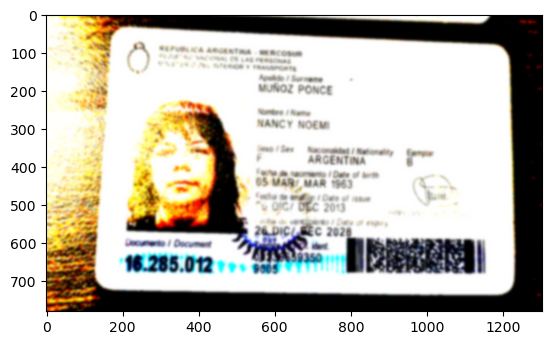

In [66]:
plt.imshow(blur)

In [ ]:
image = cv2.imread(img,0)

In [75]:
test = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [79]:
def rotacion_fina(img):
    # image = imread(filename, as_gray=True)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #threshold to get rid of extraneous noise
    thresh = threshold_otsu(image)
    normalize = image > thresh

    # gaussian blur
    blur = gaussian(normalize, 3)

    # canny edges in scikit-image
    edges = canny(blur)

    # hough lines
    hough_lines = probabilistic_hough_line(edges)

    # hough lines returns a list of points, in the form ((x1, y1), (x2, y2))
    # representing line segments. the first step is to calculate the slopes of
    # these lines from their paired point values
    slopes = [(y2 - y1)/(x2 - x1) if (x2-x1) else 0 for (x1,y1), (x2, y2) in hough_lines]

    # it just so happens that this slope is also y where y = tan(theta), the angle
    # in a circle by which the line is offset
    rad_angles = [np.arctan(x) for x in slopes]

    # and we change to degrees for the rotation
    deg_angles = [np.degrees(x) for x in rad_angles]

    # which of these degree values is most common?
    histo = np.histogram(deg_angles, bins=180)
    
    # correcting for 'sideways' alignments
    rotation_number = histo[1][np.argmax(histo[0])]

    if rotation_number > 45:
        rotation_number = -(90-rotation_number)
    elif rotation_number < -45:
        rotation_number = 90 - abs(rotation_number)

    # return rotation_number
    result = rotate_image(img,rotation_number)
    return result

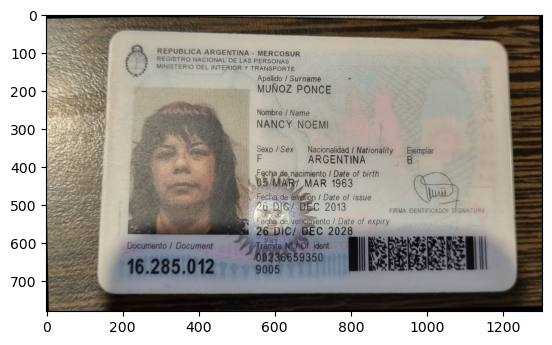

In [82]:
image = caso2.copy()
res = rotacion_fina(image)
plt.imshow(res)

In [78]:
image = caso2.copy()
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = threshold_otsu(image)
normalize = image > thresh

# gaussian blur
blur = gaussian(normalize, 3)

# canny edges in scikit-image

edges = canny(blur)

# hough lines
hough_lines = probabilistic_hough_line(edges)

# hough lines returns a list of points, in the form ((x1, y1), (x2, y2))
# representing line segments. the first step is to calculate the slopes of
# these lines from their paired point values
slopes = [(y2 - y1)/(x2 - x1) if (x2-x1) else 0 for (x1,y1), (x2, y2) in hough_lines]

# it just so happens that this slope is also y where y = tan(theta), the angle
# in a circle by which the line is offset
rad_angles = [np.arctan(x) for x in slopes]

# and we change to degrees for the rotation
deg_angles = [np.degrees(x) for x in rad_angles]

# which of these degree values is most common?
histo = np.histogram(deg_angles, bins=180)

# correcting for 'sideways' alignments
rotation_number = histo[1][np.argmax(histo[0])]

if rotation_number > 45:
    rotation_number = -(90-rotation_number)
elif rotation_number < -45:
    rotation_number = 90 - abs(rotation_number)

# return rotation_number
result = rotate_image(img,rotation_number)

NameError: name 'img' is not defined

In [ ]:
def rotacion_fina(image):
    # image = imread(filename, as_gray=True)
    # image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #threshold to get rid of extraneous noise
    thresh = threshold_otsu(image)
    normalize = image > thresh

    # gaussian blur
    blur = gaussian(normalize, 3)

    # canny edges in scikit-image
    edges = canny(blur)

    # hough lines
    hough_lines = probabilistic_hough_line(edges)

    # hough lines returns a list of points, in the form ((x1, y1), (x2, y2))
    # representing line segments. the first step is to calculate the slopes of
    # these lines from their paired point values
    slopes = [(y2 - y1)/(x2 - x1) if (x2-x1) else 0 for (x1,y1), (x2, y2) in hough_lines]

    # it just so happens that this slope is also y where y = tan(theta), the angle
    # in a circle by which the line is offset
    rad_angles = [np.arctan(x) for x in slopes]

    # and we change to degrees for the rotation
    deg_angles = [np.degrees(x) for x in rad_angles]

    # which of these degree values is most common?
    histo = np.histogram(deg_angles, bins=180)
    
    # correcting for 'sideways' alignments
    rotation_number = histo[1][np.argmax(histo[0])]

    if rotation_number > 45:
        rotation_number = -(90-rotation_number)
    elif rotation_number < -45:
        rotation_number = 90 - abs(rotation_number)

    # return rotation_number
    result = rotate_image(img,rotation_number)
    return result

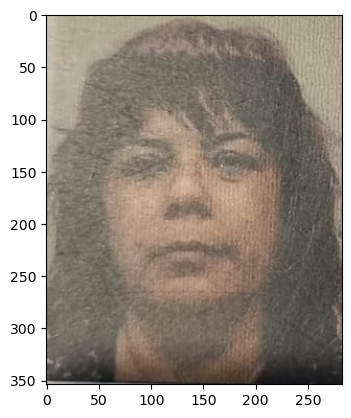

In [30]:
plt.imshow(get_face(np.asarray(caso)))

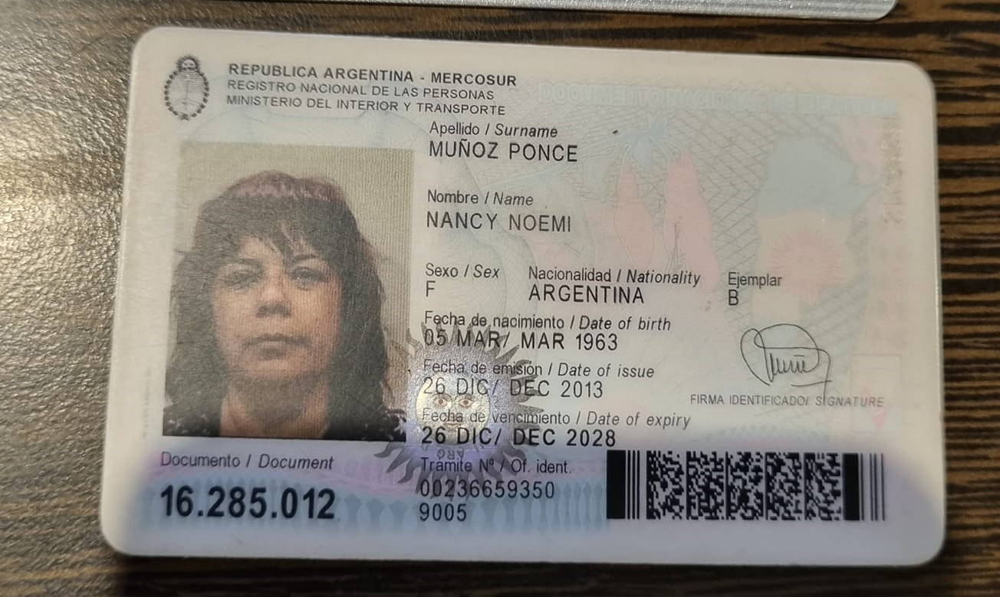

In [24]:
dataset['test']['image'][0]

----

# Takeaway

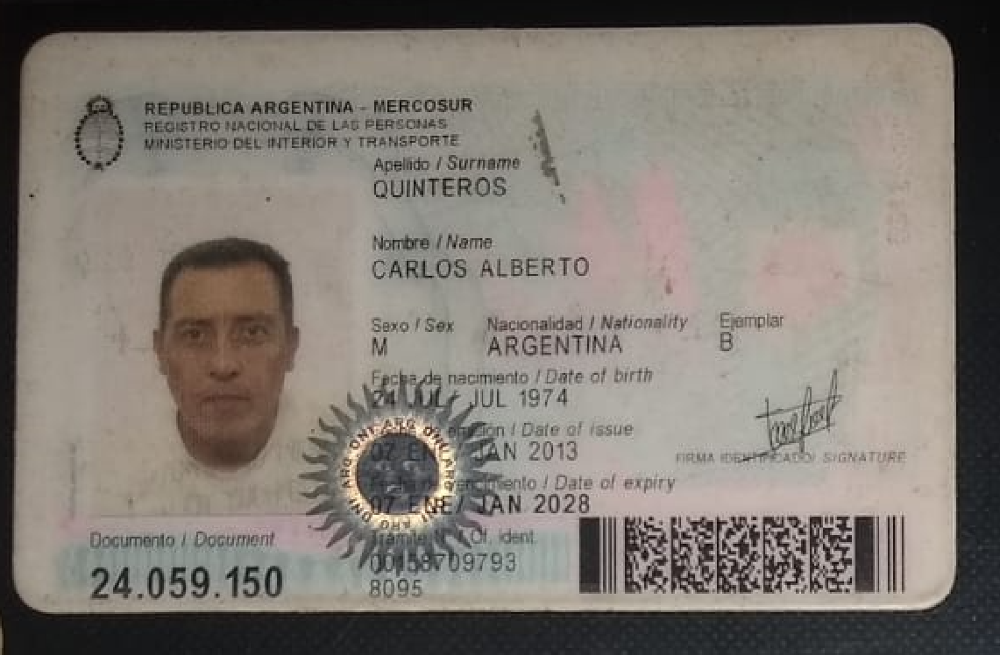

In [88]:
dataset['test']['image'][10]

In [90]:
caso = dataset['test']['image'][10].copy()
compute2(caso)

{'apellido': ' QUINTEROS',
 'nombre': ' CARLOS ALBERTO',
 'dni': ' 24059150',
 'fecha_nac': ' 24 JUL/ JUL 1974',
 'fecha_emision': '22 ENE/ JAN'}

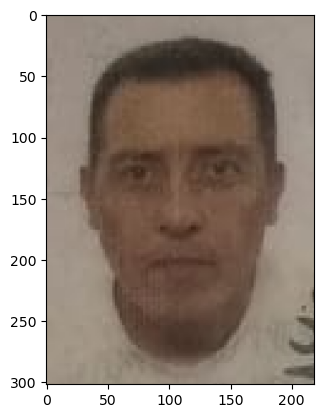

In [91]:
plt.imshow(get_face(np.asarray(caso)))

---

# Barcode Model

In [113]:
    # img = cv2.imread(path_name)
img = fotos[0][1]
def barcode(img):
        results = zxingcpp.read_barcodes(img)
        try:
            output = results[0].text.split('@')
            # print(results[0].text.split('@'),end='\r')
            # res_ls.append([foto] + r)
            keys = 'nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision'.split(',')
            if len(output) == len(keys):
                output_dict = dict(zip(keys,output))
            else:
                output_dict = {}
                for k,v in enumerate(output):
                    output_dict[k] = v
        except:
            print("Could not find any barcode.",end='\r')  
            output_dict = {}
        
        return output_dict

In [130]:
img = fotos[1][1]
results = zxingcpp.read_barcodes(img)
output = results[0].text.split('@')
print(len(output))
keys = 'nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision,num_200'.split(',')
len(keys)
      # if len(output) == len(keys):
output_dict = dict(zip(keys,output))
      #       else:
      #           output_dict = {}
      #           for k,v in enumerate(output):
      #               output_dict[k] = v

9


In [139]:
def barcode(img):
        results = zxingcpp.read_barcodes(img)
        try:
            output = results[0].text.split('@')
            # print(results[0].text.split('@'),end='\r')
            keys = 'nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision,num_200'.split(',')
            # if len(output) == len(keys):
            #     output_dict = dict(zip(keys,output))
            # else:
            #     output_dict = {}
            #     for k,v in enumerate(output):
            #         output_dict[k] = v
            output_dict = dict(zip(keys,output))
        except:
            print("Could not find any barcode.",end='\r')  
            output_dict = {}
        
        return output_dict
test = barcode(fotos[1][1])
test

{'nro_tramite': '00643523787',
 'apellido': 'VAZQUEZ BROQUA',
 'nombre': 'MILO',
 'genero': 'M',
 'dni': '58635191',
 'clase': 'A',
 'fecha_nac': '11/10/2020',
 'fecha_emision': '17/12/2020',
 'num_200': '206'}

In [148]:
def BarcodeModel(img):
        results = zxingcpp.read_barcodes(img)
        try:
            output = results[0].text.split('@')
            # print(results[0].text.split('@'),end='\r')
            keys = 'nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision,num_200'.split(',')
            # if len(output) == len(keys):
            #     output_dict = dict(zip(keys,output))
            # else:
            #     output_dict = {}
            #     for k,v in enumerate(output):
            #         output_dict[k] = v
            output_dict = dict(zip(keys,output))
        except:
            print("Could not find any barcode.",end='\r')  
            output_dict = {}
        
        return output_dict

In [149]:
# from utils import BarcodeModel
test = BarcodeModel(fotos[1][1])
test

{'nro_tramite': '00643523787',
 'apellido': 'VAZQUEZ BROQUA',
 'nombre': 'MILO',
 'genero': 'M',
 'dni': '58635191',
 'clase': 'A',
 'fecha_nac': '11/10/2020',
 'fecha_emision': '17/12/2020',
 'num_200': '206'}

---

# FUNCION PARA MODELO TRANSFORMERS: COMPUTE

## compute

In [151]:
def compute(img,np_array=False):
    ''' 
    infer from model to dict
    '''
    
    if np_array==True:
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = PIL.Image.fromarray(img)
    
    inputs = processor(images=img, return_tensors="pt")    
    # run Pix2Struct:
    generated_ids = model.generate(**inputs, max_new_tokens=50)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

## compute2

In [211]:
def compute2(img,np_array=False):
    ''' 
    es compute + una organización del output en un diccionario.
    '''
    
    if np_array==True:
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = PIL.Image.fromarray(img)
    
    inputs = processor(images=img, return_tensors="pt")    
    # run Pix2Struct:
    generated_ids = model.generate(**inputs, max_new_tokens=50)
    texto = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    output = organizar(str([texto]))
    return output

In [180]:
processor = AutoProcessor.from_pretrained("juanivazquez/id_card-pix2struct-model-v3")
model = Pix2StructForConditionalGeneration.from_pretrained("juanivazquez/id_card-pix2struct-model-v3")

In [154]:
test = compute(img)
test

'<s_apellido> VAZQUEZ BROUA</s_apellido><s_nombre> MILO</s_nombre><s_dni> 58635191</s_dni><s_fecha_nac> 11 OCT/ OCT 2020</s_fecha_nac><s_fecha_emision> 11 DIC/ DEC 20'

In [167]:
import re

string = str([test])# '['+ test + ']'

# Pattern to match the key-value pairs
pattern = r"<s_([\w]+)>(.*?)<\/s_([\w]+)>"

# Find all matches using regular expression
matches = re.findall(pattern, string)

# Convert matches to a dictionary with 's_' removed from keys
dictionary = {key_1: value_1 for key_1, value_1, _ in matches}

# Check if the last part of the string is missing the closing tag
if string.endswith("']"):
    # Extract the key and value from the last part of the string
    last_part = string.rsplit("<s_", 1)[1].strip("']")

    # Split the last part into key and value
    last_key, last_value = last_part.split(">", 1)
    last_key = last_key.strip()
    last_value = last_value.strip()

    # Add the key-value pair to the dictionary
    dictionary[last_key] = last_value

print(dictionary)

{'apellido': ' VAZQUEZ BROUA', 'nombre': ' MILO', 'dni': ' 58635191', 'fecha_nac': ' 11 OCT/ OCT 2020', 'fecha_emision': '11 DIC/ DEC 20'}


---
fotos

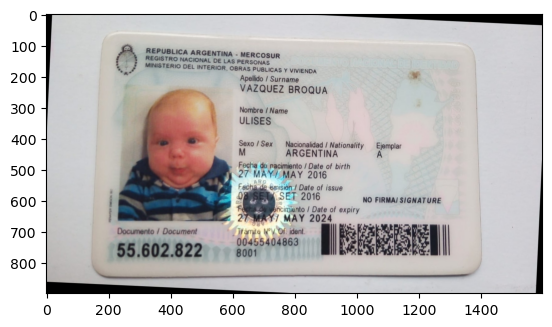

In [206]:
plt.imshow(rotate_image(fotos[2][1],-2.629103685151364))

## compute 3

In [187]:

#deskewing function
def deskew(filename):
    image = imread(filename, as_gray=True)

    #threshold to get rid of extraneous noise
    thresh = threshold_otsu(image)
    normalize = image > thresh

    # gaussian blur
    blur = gaussian(normalize, 3)

    # canny edges in scikit-image
    edges = canny(blur)

    # hough lines
    hough_lines = probabilistic_hough_line(edges)

    # hough lines returns a list of points, in the form ((x1, y1), (x2, y2))
    # representing line segments. the first step is to calculate the slopes of
    # these lines from their paired point values
    slopes = [(y2 - y1)/(x2 - x1) if (x2-x1) else 0 for (x1,y1), (x2, y2) in hough_lines]

    # it just so happens that this slope is also y where y = tan(theta), the angle
    # in a circle by which the line is offset
    rad_angles = [np.arctan(x) for x in slopes]

    # and we change to degrees for the rotation
    deg_angles = [np.degrees(x) for x in rad_angles]

    # which of these degree values is most common?
    histo = np.histogram(deg_angles, bins=180)
    
    # correcting for 'sideways' alignments
    rotation_number = histo[1][np.argmax(histo[0])]

    if rotation_number > 45:
        rotation_number = -(90-rotation_number)
    elif rotation_number < -45:
        rotation_number = 90 - abs(rotation_number)

    return rotation_number


def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result

# Nuevas Funciones

In [15]:
# UBICACION DE MODELO
deploy = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\deploy.prototxt'
caffemodel = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\res10_300x300_ssd_iter_140000.caffemodel'


def best_detection_confidence(image):
    # Model architecture
    prototxt = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\deploy.prototxt'
    # Weights
    model = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\res10_300x300_ssd_iter_140000.caffemodel'
    net = cv2.dnn.readNetFromCaffe(prototxt, model)
    image_resized = cv2.resize(image, (300, 300))
    # Create a blob
    blob = cv2.dnn.blobFromImage(image_resized, 1.0, (300, 300), (104, 117, 123))
    # print("blob.shape: ", blob.shape)
    blob_to_show = cv2.merge([blob[0][0], blob[0][1], blob[0][2]])
    # ------- DETECTIONS AND PREDICTIONS ----------
    net.setInput(blob)
    detections = net.forward()
    best = detections[0][0].copy()
    best_detection_confidence = best[best[:,2].argsort()][-1][2]
    
    # for detection in detections[0][0]:
    #      if detection[2] > 0.5:
    #         print(detection[2])
    #         box = detection[3:7] * [width, height, width, height]
    return best_detection_confidence

# img_90 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
# img_180 = cv2.rotate(image, cv2.ROTATE_180)
# img_270 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)

def search_orientation(img):
    '''
    busca la orientación que mejor reconozca un rostro humano mediante rotaciones de 90 grados
    '''
    # plt.imshow(img)
    res_ls = []
    best = best_detection_confidence(img)
    res_ls.append([best,img])
    for i in range(3):
        img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
        best = best_detection_confidence(img)
        res_ls.append([best,img])
    res_ls = sorted(res_ls, key=lambda x: x[0])
    print(f'max: {int(res_ls[3][0]*100)}',end='\r')
    output = res_ls[3][1]
    plt.imshow(output)
    return output

def get_face(image,up=0.25,side=0.25):
    
    
    # Model architecture
    prototxt = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\deploy.prototxt'
    # Weights
    model = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\res10_300x300_ssd_iter_140000.caffemodel'
    net = cv2.dnn.readNetFromCaffe(prototxt, model)
    image_resized = cv2.resize(image, (300, 300))
    # Create a blob
    blob = cv2.dnn.blobFromImage(image_resized, 1.0, (300, 300), (104, 117, 123))
    blob_to_show = cv2.merge([blob[0][0], blob[0][1], blob[0][2]])
    # ------- DETECTIONS AND PREDICTIONS ----------
    net.setInput(blob)
    detections = net.forward()
    best = detections[0][0].copy()
 
    # ------- NOS QUEDAMOS CON LA MEJOR ----------
    height, width =  image.shape[0:2]
    best_location = best[best[:,2].argsort()][-1][3:7]
    box = best_location * [width, height, width, height]
    box = [ int(x) for x in box ]
    crop_img = image[box[1]-int((box[3]-box[1])*up):box[1]+int((box[3]-box[1])*(1+up)), box[0]-int((box[2]-box[0])*side):box[0]+int((box[2]-box[0])*(1+side))]
    return crop_img

In [34]:

def rotacion_fina(img):
    # image = imread(filename, as_gray=True)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #threshold to get rid of extraneous noise
    thresh = threshold_otsu(image)
    normalize = image > thresh

    # gaussian blur
    blur = gaussian(normalize, 3)

    # canny edges in scikit-image
    edges = canny(blur)

    # hough lines
    hough_lines = probabilistic_hough_line(edges)

    # hough lines returns a list of points, in the form ((x1, y1), (x2, y2))
    # representing line segments. the first step is to calculate the slopes of
    # these lines from their paired point values
    slopes = [(y2 - y1)/(x2 - x1) if (x2-x1) else 0 for (x1,y1), (x2, y2) in hough_lines]

    # it just so happens that this slope is also y where y = tan(theta), the angle
    # in a circle by which the line is offset
    rad_angles = [np.arctan(x) for x in slopes]

    # and we change to degrees for the rotation
    deg_angles = [np.degrees(x) for x in rad_angles]

    # which of these degree values is most common?
    histo = np.histogram(deg_angles, bins=180)
    
    # correcting for 'sideways' alignments
    rotation_number = histo[1][np.argmax(histo[0])]

    if rotation_number > 45:
        rotation_number = -(90-rotation_number)
    elif rotation_number < -45:
        rotation_number = 90 - abs(rotation_number)

    # return rotation_number
    result = rotate_image(img,rotation_number)
    return result

def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result

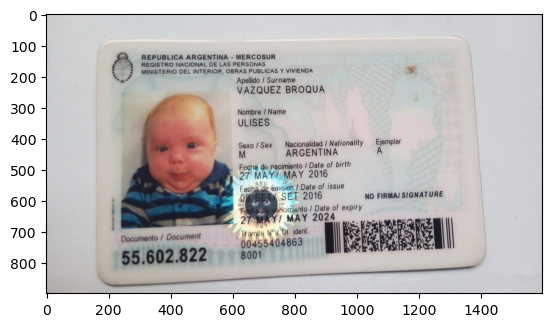

In [24]:
coso = search_orientation(fotos[2][1])
plt.imshow(coso)

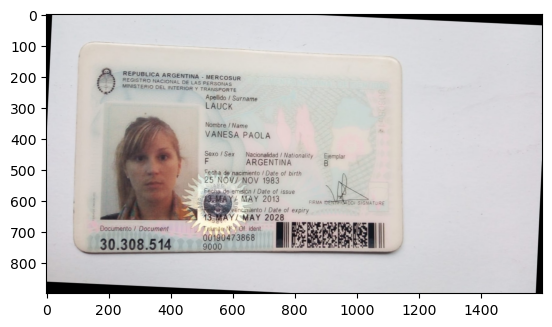

In [31]:
coso = rotacion_fina(fotos[3][1])
plt.imshow(coso)

In [38]:
test = compute2(coso)
test

{'apellido': ' LAUCK',
 'nombre': ' VANESA PAOLA',
 'dni': ' 30308544',
 'fecha_nac': ' 25 NOV/ NOV 1983',
 'fecha_emision': '13 MAY/ MAY 201'}

In [39]:
corrida = compute2(fotos[3][1])
corrida

{'apellido': ' LAUCK',
 'nombre': ' VANESA PAOLA',
 'dni': ' 30308514',
 'fecha_nac': ' 25 NOV/ NOV 1983',
 'fecha_emision': '23 MAY/ MAY 201'}

In [ ]:
np.array(im)

In [45]:
type(fotos[3][1])

numpy.ndarray

In [32]:
def compute3(img):
    ''' 
    infer from model to dict
    '''
    img = rotacion_fina(img)
    
    if type(img)==np.ndarray:
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = PIL.Image.fromarray(img)
        
    inputs = processor(images=img, return_tensors="pt")    
    # run Pix2Struct:
    generated_ids = model.generate(**inputs, max_new_tokens=50)
    texto = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    output = organizar(str([texto]))
    return output

In [53]:
res_ls = []
for i in tqdm(range(4)):
    temp = compute3(fotos[i][1])
    res_ls.append(temp)
res_df = pd.DataFrame(res_ls)
res_df

  0%|          | 0/4 [00:00<?, ?it/s]

,apellido,nombre,dni,fecha_nac,fecha_emision
0,VAZQUEZ BROUUA,JUAN IGNACIO,32402475,13 JUN/ JUN 1986,27 FEB/
1,VAZQUEZ BROUA,MILO,58635191,11 OCT/ OCT 2020,12 DIC/ DEC 20
2,VAZQUEZ BROUA,ULISES,55602822,27 MAY/ MAY 2016,08 SEP/ SEP 20
3,LAUCK,VANESA PAOLA,30308544,25 NOV/ NOV 1983,13 MAY/ MAY 201


---

In [54]:
fotos = os.listdir(r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento')
print(len(fotos))
fotos = [foto for foto in fotos if foto[-1]=='g']
len(fotos)

1517


1512

In [61]:
img = cv2.imread(img_path)
img

In [64]:
fotos[0]

'07.06.2023_10.25.55_REC.png'

In [68]:
# Generador de Resultados:

res_ls = []
for foto in tqdm(fotos):
    img_path =  os.path.join(r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento',foto)
    img = cv2.imread(img_path)
    temp = compute3(img)
    res_ls.append(temp)
res_df = pd.DataFrame(res_ls)
res_df['img']=fotos
res_df

  0%|          | 0/1512 [00:00<?, ?it/s]

,apellido,nombre,dni,fecha_nac,fecha_emision,img
0,DIAZ,GRACIELA NOEMI,13329432,10 SEP/ SEP 1957,21 JUN/ JUN 2,07.06.2023_10.25.55_REC.png
1,ROMERO,MILAC ILLAY,46747150,17 NOV/ NOV 2005,27 MAY/ MAY 2014,07.06.2023_10.26.17_REC.png
2,MAZA,MARIA BELEN,36743946,25 OCT/ OCT 1953,23 MAR/ MAR 2018</s_fecha_emision>,07.06.2023_10.27.02_REC.png
3,DIAZ,GRACIELA NOEMI,13329432,13 SEP/ SEP 1957,21 JUN/ JUN 2,07.06.2023_10.54.58_REC.png
4,ROMERO,MILAC ILLAY,46747150,17 NOV/ NOV 2005,27 MAY/ MAY 2014</s_fecha_emision>,07.06.2023_10.55.09_REC.png
...,...,...,...,...,...,...
1507,EZEQUIEL,JANELLE LEARE,37977344,24 JUN/ JUN 1994,11 FEB/ FE,images (2).jpg
1508,MALINA,FRANCISCO FRANCISCO,41119887,11 NOV/ NOV 1987,11 FEB/,images (3).jpg
1509,EZEQUIEL,JAIME LEAMON,37977444,26 JUN/ JUN 1994,11 FEB/ FEB,images.jpg
1510,SEGUNDO,JOSE EULALIO,47488821,15 ENE/ JAN 1995,15 OCT/ OCT,IMG-20170517-WA0001.jpg


In [69]:
res_df.to_pickle('res_df.pkl')

---

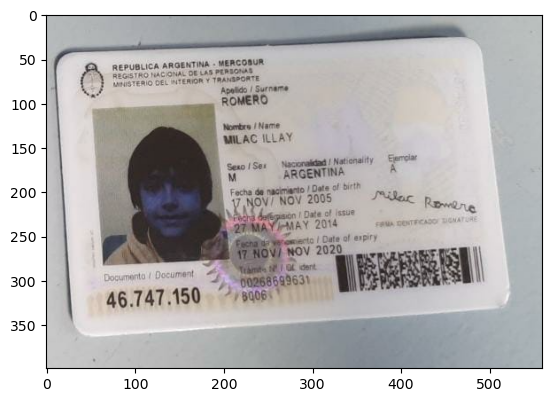

In [71]:
path_fotos = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento'
imagen = cv2.imread(os.path.join(path_fotos,fotos[1]))
plt.imshow(imagen)

# REMOVER BRILLO DE SOL 

fuentes:
    
    https://www.tutorialspoint.com/how-to-change-the-contrast-and-brightness-of-an-image-using-opencv-in-python

In [ ]:
import cv2
import numpy as np

# read image
img = image = fotos[3][1]
hh, ww = img.shape[:2]

# threshold
lower = (150,150,150)
upper = (240,240,240)
thresh = cv2.inRange(img, lower, upper)

# apply morphology close and open to make mask
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))
morph = cv2.morphologyEx(morph, cv2.MORPH_DILATE, kernel, iterations=1)

# floodfill the outside with black
black = np.zeros([hh + 2, ww + 2], np.uint8)
mask = morph.copy()
mask = cv2.floodFill(mask, black, (0,0), 0, 0, 0, flags=8)[1]

# use mask with input to do inpainting
result1 = cv2.inpaint(img, mask, 101, cv2.INPAINT_TELEA)
result2 = cv2.inpaint(img, mask, 101, cv2.INPAINT_NS)

# # write result to disk
# cv2.imwrite("tomato_thresh.jpg", thresh)
# cv2.imwrite("tomato_morph.jpg", morph)
# cv2.imwrite("tomato_mask.jpg", mask)
# cv2.imwrite("tomato_inpaint1.jpg", result1)
# cv2.imwrite("tomato_inpaint2.jpg", result2)

# display it
cv2.imshow("IMAGE", img)
cv2.imshow("THRESH", thresh)
cv2.imshow("MORPH", morph)
cv2.imshow("MASK", mask)
cv2.imshow("RESULT1", result1)
cv2.imshow("RESULT2", result2)
cv2.waitKey(0)

In [6]:
image = fotos[3][1]
def create_mask(image):
    gray = cv2.cvtColor( image, cv2.COLOR_BGR2GRAY )
    blurred = cv2.GaussianBlur( gray, (9,9), 0 )
    _,thresh_img = cv2.threshold( blurred, 180, 255, cv2.THRESH_BINARY)
    thresh_img = cv2.erode( thresh_img, None, iterations=2 )
    thresh_img  = cv2.dilate( thresh_img, None, iterations=4 )
    # perform a connected component analysis on the thresholded image,
    # then initialize a mask to store only the "large" components
    labels = measure.label( thresh_img, neighbors=8, background=0 )
    mask = np.zeros( thresh_img.shape, dtype="uint8" )
    # loop over the unique components
    for label in np.unique( labels ):
        # if this is the background label, ignore it
        if label == 0:
            continue
        # otherwise, construct the label mask and count the
        # number of pixels
        labelMask = np.zeros( thresh_img.shape, dtype="uint8" )
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero( labelMask )
        # if the number of pixels in the component is sufficiently
        # large, then add it to our mask of "large blobs"
        if numPixels > 300:
            mask = cv2.add( mask, labelMask )
    return mask

test = create_mask(image)

NameError: name 'measure' is not defined

In [7]:
# load the image, convert it to grayscale, and blur it
# image = cv2.imread(args["image"])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (11, 11), 0)

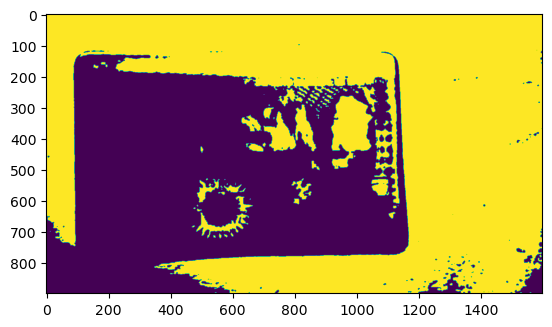

In [13]:
# threshold the image to reveal light regions in the
# blurred image
thresh = cv2.threshold(blurred, 210, 255, cv2.THRESH_BINARY)[1] # 200, 255
plt.imshow(thresh)

In [ ]:
# perform a connected component analysis on the thresholded
# image, then initialize a mask to store only the "large"
# components
labels = measure.label(thresh, neighbors=8, background=0)
mask = np.zeros(thresh.shape, dtype="uint8")
# loop over the unique components
for label in np.unique(labels):
	# if this is the background label, ignore it
	if label == 0:
		continue
	# otherwise, construct the label mask and count the
	# number of pixels 
	labelMask = np.zeros(thresh.shape, dtype="uint8")
	labelMask[labels == label] = 255
	numPixels = cv2.countNonZero(labelMask)
	# if the number of pixels in the component is sufficiently
	# large, then add it to our mask of "large blobs"
	if numPixels > 300:
		mask = cv2.add(mask, labelMask)

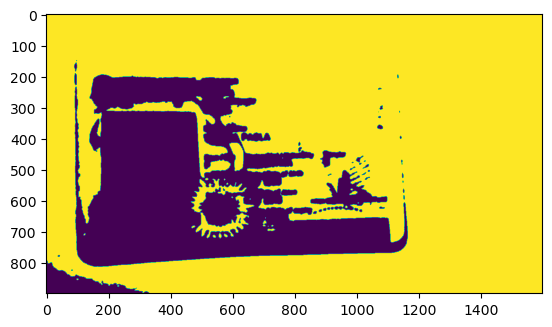

In [39]:
_, mask = cv2.threshold(blurred, 200, 255, cv2.THRESH_BINARY)
kernel = np.ones((5, 5), np.uint8)
dilated_mask = cv2.dilate(mask, kernel, iterations=2)
plt.imshow(mask)

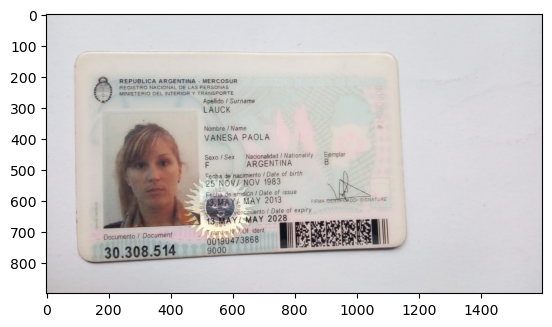

In [50]:
plt.imshow(image)

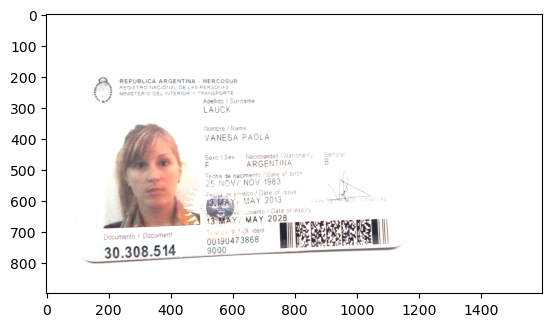

In [51]:
alpha = 1.5 # 1.5 # Contrast control
beta =  10 # Brightness control

# call convertScaleAbs function
adjusted = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
plt.imshow(adjusted)

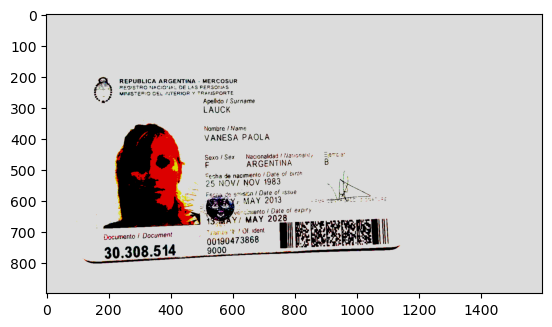

In [75]:
_, mask = cv2.threshold(adjusted, 210, 220, cv2.THRESH_BINARY)
plt.imshow(mask)

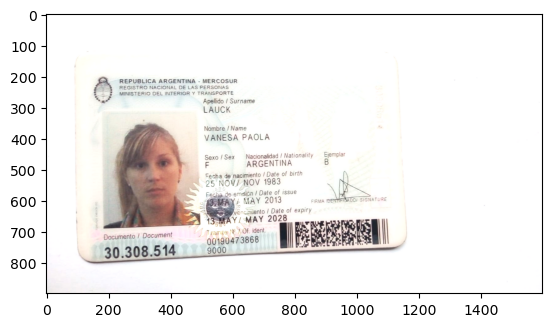

In [76]:
alpha = 1.2 # 1.5 # Contrast control
beta =  10 # Brightness control

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(blurred, 210, 255, cv2.THRESH_BINARY_INV)
output_image[mask != 0] = cv2.convertScaleAbs(image[mask != 0], alpha=alpha, beta=beta)
plt.imshow(output_image)


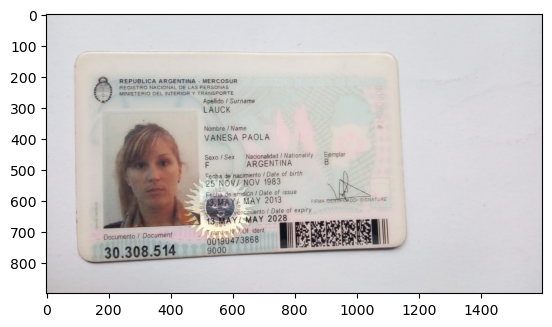

In [63]:
plt.imshow(image)

In [53]:
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# # Reduce the brightness of the grayscale image
# lowered_brightness = gray // 2

# # Apply adaptive thresholding to create a binary mask that highlights the glared region
# #_, mask = cv2.threshold(lowered_brightness, 200, 255, cv2.THRESH_BINARY_INV)

# #_, mask = cv2.threshold(blurred, 200, 255, cv2.THRESH_BINARY)


# # Create a copy of the original image and apply the mask to the copy
# output_image = image.copy()
# output_image[mask != 0] = np.mean(image) 
# plt.imshow(output_image)

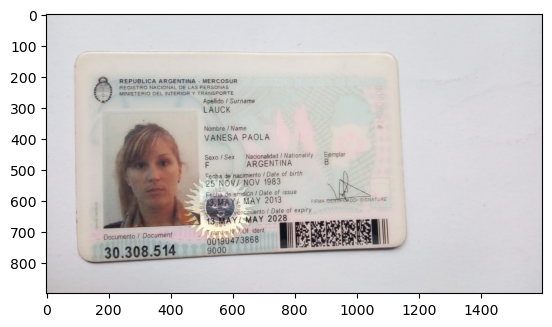

In [43]:
plt.imshow(image)

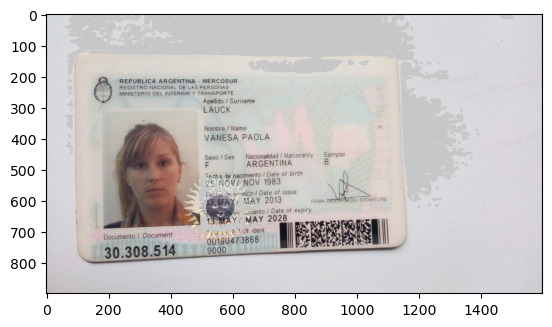

In [40]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (15, 15), 0)
_, mask = cv2.threshold(blurred, 220, 255, cv2.THRESH_BINARY)
kernel = np.ones((5, 5), np.uint8)
dilated_mask = cv2.dilate(mask, kernel, iterations=1)
output_image = image.copy()
output_image[dilated_mask != 0] = np.mean(image)
plt.imshow(output_image)

# REPASO FINAL

In [2]:
@log_execution
@timing_decorator
def levantar_fotos(path):
    fotos = os.listdir(path)
    fotos = [l for l in fotos if l[-1]=='g']
    output = []
    failed_attempts = []
    for l in fotos:
        foto = np.array(PIL.Image.open(os.path.join(path,l)))
        modo = foto.mode
        output.append([l,foto,modo])
        # except:
        #     fail.append(l)
    return output, failed_attempts

In [16]:
# PIL.Image.open(os.path.join(path,fotos[1][0]))

In [17]:
path_fotos = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\dnis'
fotos,fail = levantar_fotos(path_fotos)

INFO:root:Executing wrapper


AttributeError: 'numpy.ndarray' object has no attribute 'mode'

In [12]:
path =r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\dnis'
# fotos , fails = levantar_fotos(path)
fotos = os.listdir(path)
fotos = [l for l in fotos if l[-1]=='g']
len(fotos)

1258

In [5]:
path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\entrenamiento\temp\family_test'
import os
fotos = []
for l in os.listdir(path):
    foto_array = cv2.imread(os.path.join(path,l))
    foto_array = cv2.cvtColor(foto_array,cv2.COLOR_BGR2RGB)
    foto = PIL.Image.fromarray(foto_array)
    inputs = processor(images=foto, return_tensors="pt")
    fotos.append([l,foto_array,foto,inputs])

# TEST 

In [20]:
# pip install ijson

In [40]:
import os
import re
os.getcwd()

'C:\\Users\\juani\\Documents\\3_My_Jupiter_Notebooks\\5_Galicia\\0_Estatutos\\000_EAGLE_FANG'

In [ ]:
import ijson
import base64
from PIL import Image
from io import BytesIO

with open("BiometricPhotos.json", "r") as f:
    cont = 1
    for record in ijson.items(f, "item"):
        value = record["photo_as_base64"]

        # Decodificar la cadena de base64
        image_bytes = base64.b64decode(value)

        # Cargar la imagen a través de Pillow
        img = Image.open(BytesIO(image_bytes))

        # Guardar la imagen como JPEG
        img.save("imagen{}.jpg".format(cont))
        cont = cont + 1

In [36]:
from utils import *

C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\0_Estatutos\000_EAGLE_FANG\utils.py:8: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [5]:
path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\BiometricPhotos'
path_bio  = os.path.join(path,'BiometricPhotos.json')

In [8]:
with open(path_bio, "r") as f:
    cont = 1
    for record in ijson.items(f, "item"):
        value = record["photo_as_base64"]

        # Decodificar la cadena de base64
        image_bytes = base64.b64decode(value)

        # Cargar la imagen a través de Pillow
        img = Image.open(BytesIO(image_bytes))

        # Guardar la imagen como JPEG
        img.save("imagen{}.jpg".format(cont))
        cont = cont + 1

In [16]:
json_ls  =[j for j in os.listdir(path) if j[-4:]=='json']
json_ls

['BiometricPhotos 3.json', 'BiometricPhotos.json', 'BiometricPhotos2.json']

In [19]:
path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\BiometricPhotos'
destination = os.path.join(path,'fotos') 
try:
    os.mkdir(destination)
except:
    pass

json_ls  =[j for j in os.listdir(path) if j[-4:]=='json']

cont = 1

for file in json_ls:
    path_bio  = os.path.join(path,file)

    with open(path_bio, "r") as f:
        
        for record in ijson.items(f, "item"):
            value = record["photo_as_base64"]

            # Decodificar la cadena de base64
            image_bytes = base64.b64decode(value)

            # Cargar la imagen a través de Pillow
            img = Image.open(BytesIO(image_bytes))

            # Guardar la imagen como JPEG
            img.save(os.path.join(destination,"imagen{}.jpg".format(cont)))
            cont = cont + 1

---

In [26]:
import os
import cv2
import matplotlib.pyplot as plt

In [68]:
# path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\entrenamiento\temp\family_test'
fuente = os.path.join(path,'fotos_netas')
fotos = []
for l in os.listdir(fuente):
    foto_array = cv2.imread(os.path.join(fuente,l))
    foto_array = cv2.cvtColor(foto_array,cv2.COLOR_BGR2RGB)
    fotos.append([l,foto_array])

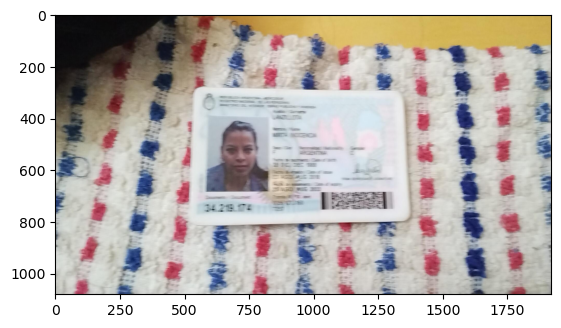

In [69]:
plt.imshow(fotos[0][1])

# PERFORMANCE METRTICS

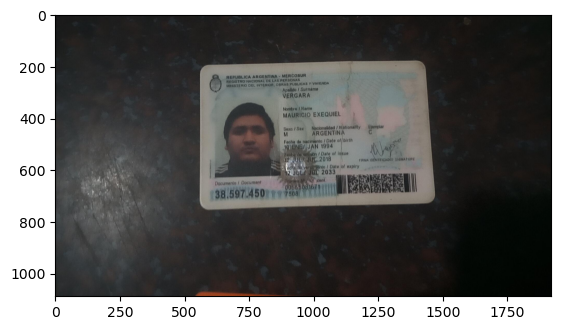

In [93]:
fuente = os.path.join(path,'fotos_netas_2')

fotos = [l for l in os.listdir(fuente) if l[-1]=='g']
l = fotos[10]
img = cv2.imread(os.path.join(fuente,l))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)

# DATOS

In [94]:
# path = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\dataset\experimento\entrenamiento\temp\family_test'
fuente = os.path.join(path,'fotos_netas_2')

fotos = [l for l in os.listdir(fuente) if l[-1]=='g']
res_ls = []
for l in fotos:
    img = cv2.imread(os.path.join(fuente,l))
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    barcode = BarcodeModel(img)
    res = compute3(img)
    res_ls.append([l,img,barcode,res])

In [243]:
df = pd.DataFrame(res_ls)
bar_df = pd.json_normalize(df[2])
bar_df.columns = [ col+'_bar' for col in bar_df.columns]
trans_df = pd.json_normalize(df[3])
trans_df.columns = [ col+'_trans' for col in trans_df.columns]
df = pd.concat([df, bar_df,trans_df], axis=1)
df.head()

,0,1,2,3,nro_tramite_bar,apellido_bar,nombre_bar,genero_bar,dni_bar,clase_bar,fecha_nac_bar,fecha_emision_bar,num_200_bar,apellido_trans,fecha_nac_trans,fecha_emision_trans,nombre_trans,dni_trans
0,imagen1.jpg,"[[[10, 10, 10], [11, 11, 11], [11, 11, 11], [1...",{},"{'apellido': ' 1425776', 'fecha_nac': ' 14 JUL...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1425776,14 JUL/ JUL 1999,14 ENE/ JAN 2019</s_fecha_emision>,NaN,NaN
1,imagen10.jpg,"[[[123, 101, 122], [122, 100, 121], [122, 100,...",{},"{'apellido': ' PADILLA SANCHEZ', 'nombre': ' E...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PADILLA SANCHEZ,14 OCT/ OCT 1991,12 MAY/ MAY 202,ENZO,36965536
2,imagen100.jpg,"[[[182, 186, 185], [182, 186, 185], [182, 186,...","{'nro_tramite': '00362379469', 'apellido': 'MA...","{'apellido': ' MARTINEZ', 'nombre': ' CHRISTIA...",00362379469,MARTINEZ,CHRISTIAN ESTEBAN,M,29877755,A,09/10/1982,24/04/2015,200,MARTINEZ,09 OCT/ OCT 1982,24 ABR/ APR,CHRISTIAN EEBAN,20877765
3,imagen11.jpg,"[[[198, 178, 167], [197, 177, 166], [197, 177,...","{'nro_tramite': '00546773049', 'apellido': 'ME...","{'apellido': ' MEDINA', 'nombre': ' JUAN RAMN'...",00546773049,MEDINA,JUAN RAMON,M,21365510,E,23/03/1970,08/05/2018,209,MEDINA,23 MAR/ MAR 1970,08 MAY/ MAY 2018</s_fecha_emision>,JUAN RAMN,21365510
4,imagen113.jpg,"[[[172, 153, 136], [171, 152, 135], [171, 152,...",{},"{'apellido': ' ROMERO', 'nombre': ' RAMON EDUA...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ROMERO,14 FEB/ FEB 1999,21 SEP/ SEP 20,RAMON EDUARDO,38887256


In [291]:
df['apellido_sim'] = [similar(i,j) for i,j in zip(df.apellido_bar,df.apellido_trans)]
df['nombre_sim'] = [similar(i,j) for i,j in zip(df.nombre_bar,df.nombre_trans)]
df['dni_sim'] = [similar(i,j) for i,j in zip(df.dni_bar,df.dni_trans)]




In [674]:
df[df.fecha_nac_sim!='nan']['fecha_nac_sim']

0                   nan
1                   nan
2      09 OCT/ OCT 1982
3      23 MAR/ MAR 1970
4                   nan
             ...       
379                 nan
380                 nan
381                 nan
382                 nan
383    17 NOV/ NOV 1984
Name: fecha_nac_bar_2, Length: 384, dtype: object

In [676]:
df['fecha_nac_bar_2'] = [fecha_dni(i) if i != 'nan' else 'nan' for i in df.fecha_nac_bar]
df['fecha_nac_sim'] = [similar(i,j) for i,j in zip(df.fecha_nac_bar_2,df.fecha_nac_trans)]
df[df.fecha_nac_bar_2!='nan']['fecha_nac_sim'].median(), df[df.fecha_nac_bar_2!='nan']['fecha_nac_sim'].mean()

(1.0, 0.9448529411764706)

In [677]:
os.getcwd()

'C:\\Users\\juani\\Documents\\3_My_Jupiter_Notebooks\\5_Galicia\\0_Estatutos\\000_EAGLE_FANG'

In [678]:
df.to_pickle('df.pkl')

In [296]:
df[df.apellido_bar!='nan']['apellido_sim'].median(), df[df.apellido_bar!='nan']['apellido_sim'].mean()

(1.0, 0.8804751419766681)

In [300]:
df[df.apellido_bar!='nan']['nombre_sim'].median(), df[df.apellido_bar!='nan']['nombre_sim'].mean()

(1.0, 0.9037277468783117)

In [302]:
df[df.apellido_bar!='nan']['dni_sim'].median(), df[df.apellido_bar!='nan']['dni_sim'].mean()

(1.0, 0.9757929642445212)

In [317]:
len(df[(df.apellido_bar!='nan')&(df.apellido_sim>0.8)]['dni_sim'])/136

0.7941176470588235

In [308]:
len(df[(df.apellido_bar!='nan')&(df.dni_sim==1)]['dni_sim'])/136

0.9191176470588235

In [309]:
len(df[(df.apellido_bar!='nan')&(df.nombre_sim==1)]['nombre_sim'])/136

0.6544117647058824

In [310]:
len(df[(df.apellido_bar!='nan')&(df.apellido_sim==1)]['apellido_sim'])/136

0.6544117647058824

In [314]:
len(df[(df.apellido_bar!='nan')&(df.apellido_sim>0.75)]['apellido_sim'])/136

0.8455882352941176

In [315]:
len(df)

384

In [ ]:
df

---

In [ ]:
df[df.apellido_bar!='nan']['dni_sim'].median(), df[df.apellido_bar!='nan']['dni_sim'].mean()

In [295]:
for col in df.filter(like='sim').columns:
    print( col, df[df[col] !='nan'][col].median(),df[df[col] !='nan'][col].mean())

apellido_sim 0.0 0.3118349461167366
nombre_sim 0.0 0.3903827436860688
dni_sim 0.0 0.4080933415032679


In [287]:
len(df[df.apellido_bar!='nan'])

136

In [286]:
len(df)

384

In [288]:
136/384

0.3541666666666667

<Axes: >

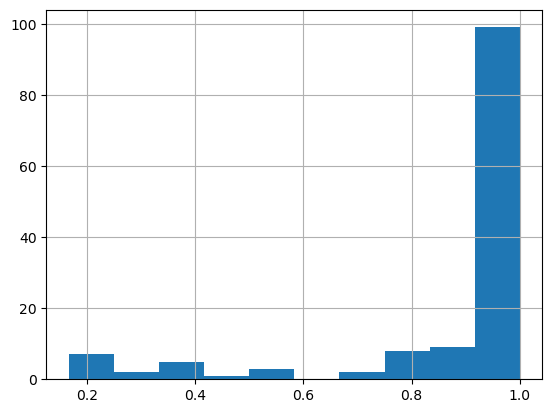

In [285]:
df[df.apellido_bar!='nan']['apellido_sim'].hist()

In [ ]:
['apellido_sim'] 

In [278]:
df[~isNaN(df.apellido_bar)]

,0,1,2,3,nro_tramite_bar,apellido_bar,nombre_bar,genero_bar,dni_bar,clase_bar,fecha_nac_bar,fecha_emision_bar,num_200_bar,apellido_trans,fecha_nac_trans,fecha_emision_trans,nombre_trans,dni_trans,apellido_sim
0,imagen1.jpg,[[[ 10 10 10]\n[ 11 11 11]\n[ 11 11 11]\...,{},"{'apellido': ' 1425776', 'fecha_nac': ' 14 JUL...",nan,nan,nan,nan,nan,nan,nan,nan,nan,1425776,14 JUL/ JUL 1999,14 ENE/ JAN 2019</s_fecha_emision>,nan,nan,0.0
1,imagen10.jpg,[[[123 101 122]\n[122 100 121]\n[122 100 121]\...,{},"{'apellido': ' PADILLA SANCHEZ', 'nombre': ' E...",nan,nan,nan,nan,nan,nan,nan,nan,nan,PADILLA SANCHEZ,14 OCT/ OCT 1991,12 MAY/ MAY 202,ENZO,36965536,0.0
2,imagen100.jpg,[[[182 186 185]\n[182 186 185]\n[182 186 185]\...,"{'nro_tramite': '00362379469', 'apellido': 'MA...","{'apellido': ' MARTINEZ', 'nombre': ' CHRISTIA...",00362379469,MARTINEZ,CHRISTIAN ESTEBAN,M,29877755,A,09/10/1982,24/04/2015,200,MARTINEZ,09 OCT/ OCT 1982,24 ABR/ APR,CHRISTIAN EEBAN,20877765,1.0
3,imagen11.jpg,[[[198 178 167]\n[197 177 166]\n[197 177 166]\...,"{'nro_tramite': '00546773049', 'apellido': 'ME...","{'apellido': ' MEDINA', 'nombre': ' JUAN RAMN'...",00546773049,MEDINA,JUAN RAMON,M,21365510,E,23/03/1970,08/05/2018,209,MEDINA,23 MAR/ MAR 1970,08 MAY/ MAY 2018</s_fecha_emision>,JUAN RAMN,21365510,1.0
4,imagen113.jpg,[[[172 153 136]\n[171 152 135]\n[171 152 135]\...,{},"{'apellido': ' ROMERO', 'nombre': ' RAMON EDUA...",nan,nan,nan,nan,nan,nan,nan,nan,nan,ROMERO,14 FEB/ FEB 1999,21 SEP/ SEP 20,RAMON EDUARDO,38887256,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,imagen989.jpg,[[[ 2 0 1]\n[ 2 0 1]\n[ 2 0 1]\...,{},"{'apellido': ' GONZALEZ', 'nombre': ' MARIA DE...",nan,nan,nan,nan,nan,nan,nan,nan,nan,GONZALEZ,02 ENE/ JAN 1975,25 OCT/ OCT 2,MARIA DEL CARMEN,24306857,0.0
380,imagen995.jpg,[[[ 7 5 6]\n[ 7 5 6]\n[ 7 5 6]\...,{},"{'apellido': ' 31502742', 'fecha_nac': '21 SEP...",nan,nan,nan,nan,nan,nan,nan,nan,nan,31502742,21 SEP/ SEP 2013</s_fecha_emision>,nan,nan,nan,0.0
381,imagen996.jpg,[[[205 211 211]\n[212 218 218]\n[219 225 225]\...,{},"{'apellido': ' VELAZQUEZ', 'nombre': ' REGINA ...",nan,nan,nan,nan,nan,nan,nan,nan,nan,VELAZQUEZ,01 NOV/ NOV 1968,12 MAY/ MAY 2,REGINA NELLY,20182084,0.0
382,imagen997.jpg,[[[137 132 74]\n[138 133 75]\n[143 138 82]\...,{},"{'apellido': ' GRANELLO', 'nombre': ' KAREN SO...",nan,nan,nan,nan,nan,nan,nan,nan,nan,GRANELLO,11 ENE/ JAN 1993,13 AGO/ AUG,KAREN SOLEDAD,37276527,0.0


In [273]:
df['apellido_sim']

0      0.0
1      0.0
2      1.0
3      1.0
4      0.0
      ... 
379    0.0
380    0.0
381    0.0
382    0.0
383    1.0
Name: apellido_sim, Length: 384, dtype: float64

In [271]:
# for col in df.columns:
#     df[col]=df[col].astype(str)
#     df[col]=df[col].apply(remove_empty_lines)

In [257]:
# Select columns starting with 'Prefix_'
df.filter(like='apellido')['apellido_bar'][0:1].values[0] == float('nan')

False

In [258]:
# https://stackoverflow.com/questions/944700/how-can-i-check-for-nan-values
def isNaN(num):
    return num != num

In [265]:
df.filter(like='apellido')[~isNaN(df.apellido_bar)]

,apellido_bar,apellido_trans
2,MARTINEZ,MARTINEZ
3,MEDINA,MEDINA
6,HOESE GIMENEZ,HOESE GIMENES
9,PATIO ARCE,CATINO ARCE
11,PATIO ARCE,PATINO ARCE
...,...,...
366,GONZALEZ,GONZALEZ
368,ALEGRIA,ALEJANDRO
376,PENAYO,PENAYO
377,SAUCEDO,SALCEDO


In [269]:
# df['apellido_sim'] = [similar(i,j) for i,j in zip(df.apellido_bar,df.apellido_trans)]

In [256]:
afloat('nan')

nan

In [114]:
from difflib import SequenceMatcher

def similar(a, b):
    return SequenceMatcher(None, a, b).ratio()
similar(gt,tr)

0.9411764705882353

---

In [ ]:
https://www.nltk.org/howto/metrics.html

In [79]:
from nltk.metrics import *

In [70]:
compute3(fotos[0][1])

{'apellido': ' 3425574',
 'fecha_nac': ' 14 ENE/ JAN 1999',
 'fecha_emision': '14 ENE/ JAN 2019</s_fecha_emision>'}

In [110]:
gt = res_ls[2][2]['apellido']
tr = res_ls[2][3]['apellido']

In [130]:
def get_carnet(image,up=0.25,side=0.25):
    
    
    # Model architecture
    prototxt = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\deploy.prototxt'
    # Weights
    model = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\res10_300x300_ssd_iter_140000.caffemodel'
    net = cv2.dnn.readNetFromCaffe(prototxt, model)
    image_resized = cv2.resize(image, (300, 300))
    # Create a blob
    blob = cv2.dnn.blobFromImage(image_resized, 1.0, (300, 300), (104, 117, 123))
    blob_to_show = cv2.merge([blob[0][0], blob[0][1], blob[0][2]])
    # ------- DETECTIONS AND PREDICTIONS ----------
    net.setInput(blob)
    detections = net.forward()
    best = detections[0][0].copy()
 
    # ------- NOS QUEDAMOS CON LA MEJOR ----------
    height, width =  image.shape[0:2]
    best_location = best[best[:,2].argsort()][-1][3:7]
    box = best_location * [width, height, width, height]
    box = [ int(x) for x in box ]
    
    base = box[1]
    alto = box[3]-box[1]
    base_ajustada = int(box[1] - 3 * alto)
    base_ajustada = [base_ajustada if base_ajustada >= 0 else 0][0]
    altura = box[1]+ alto
    altura_ajustada = int(box[1] + 3*  alto)
    izq = box[0]
    largo = box[2]-box[0]
    izq_ajustada = int(izq  - 2 * largo)
    izq_ajustada = [izq_ajustada if izq_ajustada >= 0 else 0][0]
    derecha = izq + largo
    derecha_ajustada = int(izq + 7*  largo)
    crop_img = image[base_ajustada:altura_ajustada,izq_ajustada:derecha_ajustada]

    return crop_img

# plt.imshow(get_carnet(image))

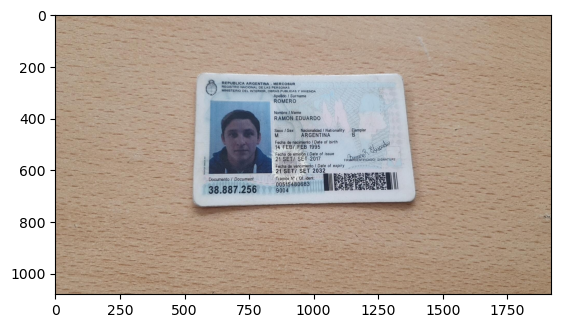

In [134]:
plt.imshow(res_ls[4][1])

In [141]:
test = compute3(res_ls[2][1])

In [142]:
test

{'apellido': ' MARTINEZ',
 'nombre': ' CHRISTIAN ESTEBAN',
 'dni': ' 29877755',
 'fecha_nac': ' 09 OCT/ OCT 1982',
 'fecha_emision': '24 ABR/ APR'}

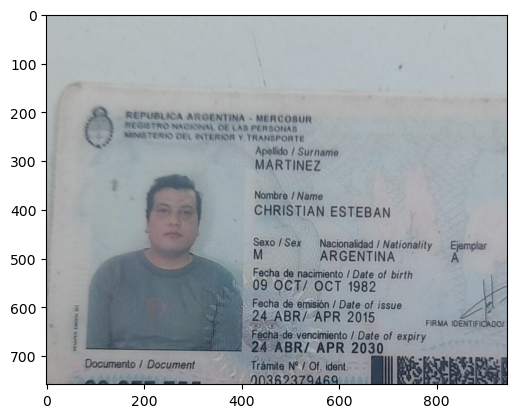

In [138]:
plt.imshow(get_carnet(res_ls[2][1]))

In [120]:
for key in ['apellido', 'nombre', 'dni', 'fecha_nac']:
    gt = res_ls[2][2][key]
    tr = res_ls[2][3][key]
    s = similar(gt,tr)
    print(f'{key}: {np.round(s*100,1)} - {gt} {tr}')

apellido: 94.1 - MARTINEZ  MARTINEZ
nombre: 90.9 - CHRISTIAN ESTEBAN  CHRISTIAN EEBAN
dni: 70.6 - 29877755  20877765
fecha_nac: 51.9 - 09/10/1982  09 OCT/ OCT 1982


In [143]:

gt,tr

('09/10/1982', ' 09 OCT/ OCT 1982')

In [174]:
# @timing_decorator
def remove_empty_lines(string):
    pattern = r'^\s+(?=\S)'
    return re.sub(pattern, '', string, flags=re.MULTILINE)
remove_empty_lines()

Function remove_empty_lines took 0.0 seconds to run.


'a ver que pasa acá    '

In [179]:
tr = remove_empty_lines(res_ls[2][3]['apellido'])
accuracy(res_ls[2][2]['apellido'],tr)


Function remove_empty_lines took 0.0 seconds to run.


1.0

In [146]:
pd.to_datetime(gt)

Timestamp('1982-09-10 00:00:00')

---

In [71]:
len(fotos)

600

In [72]:
barcode_ls = []
for i in range(len(fotos)):
    temp = BarcodeModel(fotos[i][1])
    barcode_ls.append([fotos[i][0],temp])

In [73]:
len(barcode_ls)

600

In [74]:
barcode_ls = [ l for l in barcode_ls if len(l[1])>0]
len(barcode_ls)

138

In [87]:
df = pd.DataFrame(barcode_ls,columns=['img','data'])
df = pd.concat([df,pd.DataFrame.from_dict(df.data.tolist())],axis=1)
df.head()

,img,data,nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision,num_200
0,imagen100.jpg,"{'nro_tramite': '00362379469', 'apellido': 'MA...",00362379469,MARTINEZ,CHRISTIAN ESTEBAN,M,29877755,A,09/10/1982,24/04/2015,200
1,imagen11.jpg,"{'nro_tramite': '00546773049', 'apellido': 'ME...",00546773049,MEDINA,JUAN RAMON,M,21365510,E,23/03/1970,08/05/2018,209
2,imagen120.jpg,"{'nro_tramite': '00340533078', 'apellido': 'HO...",00340533078,HOESE GIMENEZ,CINTIA BELEN,F,33095367,A,15/11/1987,05/02/2015,270
3,imagen128.jpg,"{'nro_tramite': '00397539174', 'apellido': 'PA...",00397539174,PATIO ARCE,JOSE CARLOS,M,95141863,B,19/03/1999,07/09/2015,204
4,imagen136.jpg,"{'nro_tramite': '00397539174', 'apellido': 'PA...",00397539174,PATIO ARCE,JOSE CARLOS,M,95141863,B,19/03/1999,07/09/2015,204


# Función Integradora

In [225]:
from utils import *

In [210]:
def get_face(image,up=0.25,side=0.25):
    
    
    # Model architecture
    prototxt = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\deploy.prototxt'
    # Weights
    model = r'C:\Users\juani\Documents\3_My_Jupiter_Notebooks\5_Galicia\4_lector_de_dnis\caffe_model\res10_300x300_ssd_iter_140000.caffemodel'
    net = cv2.dnn.readNetFromCaffe(prototxt, model)
    image_resized = cv2.resize(image, (300, 300))
    # Create a blob
    blob = cv2.dnn.blobFromImage(image_resized, 1.0, (300, 300), (104, 117, 123))
    blob_to_show = cv2.merge([blob[0][0], blob[0][1], blob[0][2]])
    # ------- DETECTIONS AND PREDICTIONS ----------
    net.setInput(blob)
    detections = net.forward()
    best = detections[0][0].copy()
 
    # ------- NOS QUEDAMOS CON LA MEJOR ----------
    height, width =  image.shape[0:2]
    best_location = best[best[:,2].argsort()][-1][3:7]
    box = best_location * [width, height, width, height]
    box = [ int(x) for x in box ]
    crop_img = image[box[1]-int((box[3]-box[1])*up):box[1]+int((box[3]-box[1])*(1+up)), box[0]-int((box[2]-box[0])*side):box[0]+int((box[2]-box[0])*(1+side))]
    return crop_img

In [201]:
@timing_decorator
def integral(img):
    m0 = BarcodeModel(img)
    if len(m0)>0:
        return m0
    else:
        img = search_orientation(img)
        img = rotacion_fina(img)
        m0 = BarcodeModel(img)
        if len(m0)>0:
            return m0
        else:
            m1 = compute2(img)
            return m1
    

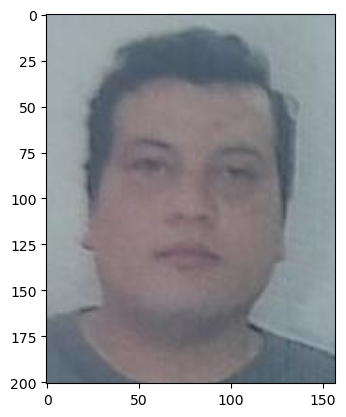

In [211]:
plt.imshow(get_face(img))

In [202]:
img = res_ls[2][1].copy()
test = integral(img)
test

Function integral took 0.03696608543395996 seconds to run.


{'nro_tramite': '00362379469',
 'apellido': 'MARTINEZ',
 'nombre': 'CHRISTIAN ESTEBAN',
 'genero': 'M',
 'dni': '29877755',
 'clase': 'A',
 'fecha_nac': '09/10/1982',
 'fecha_emision': '24/04/2015',
 'num_200': '200'}

In [ ]:
rotacion_fina(get_carnet(res_ls[10][1]))

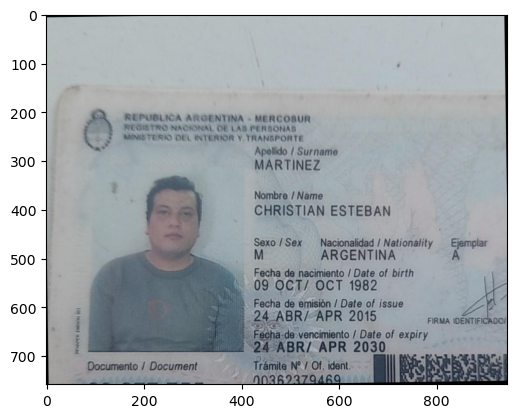

In [195]:
plt.imshow(rotacion_fina(get_carnet(res_ls[2][1])))

In [196]:
BarcodeModel(res_ls[2][1])

{'nro_tramite': '00362379469',
 'apellido': 'MARTINEZ',
 'nombre': 'CHRISTIAN ESTEBAN',
 'genero': 'M',
 'dni': '29877755',
 'clase': 'A',
 'fecha_nac': '09/10/1982',
 'fecha_emision': '24/04/2015',
 'num_200': '200'}

In [197]:
compute3(rotacion_fina(res_ls[2][1]))

{'apellido': ' MARTINEZ',
 'nombre': ' CHRISTIAN ESTEBAN',
 'dni': ' 29877755',
 'fecha_nac': ' 09 OCT/ OCT 1982',
 'fecha_emision': '24 ABR/ APR'}

---

In [191]:
compute3(rotacion_fina(get_carnet(res_ls[10][1])))

{'apellido': ' VERGARA',
 'nombre': ' MAURICIO EXEQUIEL',
 'dni': ' 38597450',
 'fecha_nac': ' 10 ENE/ JAN 1994',
 'fecha_emision': '17 JUL/ JUL'}

In [118]:
filename_ls = list(map(lambda x: x[0], res_ls))
fotos_ls = list(map(lambda x: x[1], res_ls))
barcode_ls = list(map(lambda x: x[2], res_ls))
transformer_ls = list(map(lambda x: x[3], res_ls))

NameError: name 'res_ls' is not defined

In [ ]:
normalized_df = pd.json_normalize(df['Column'])

In [219]:
pd.DataFrame(barcode_ls)

,nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision,num_200
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00362379469,MARTINEZ,CHRISTIAN ESTEBAN,M,29877755,A,09/10/1982,24/04/2015,200
3,00546773049,MEDINA,JUAN RAMON,M,21365510,E,23/03/1970,08/05/2018,209
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
379,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
380,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
382,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_transformers =pd.DataFrame(transformer_ls)
df_transformers['apellido']=df_transformers['apellido'].apply(remove_empty_lines)

In [230]:
# df_transformers[0:10]

In [231]:
df_barcode =pd.DataFrame(barcode_ls)
df_barcode.head()

,nro_tramite,apellido,nombre,genero,dni,clase,fecha_nac,fecha_emision,num_200
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00362379469,MARTINEZ,CHRISTIAN ESTEBAN,M,29877755,A,09/10/1982,24/04/2015,200
3,00546773049,MEDINA,JUAN RAMON,M,21365510,E,23/03/1970,08/05/2018,209
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [327]:
df[df['apellido_bar']=='nan']

,0,1,2,3,nro_tramite_bar,apellido_bar,nombre_bar,genero_bar,dni_bar,clase_bar,...,fecha_emision_bar,num_200_bar,apellido_trans,fecha_nac_trans,fecha_emision_trans,nombre_trans,dni_trans,apellido_sim,nombre_sim,dni_sim
0,imagen1.jpg,[[[ 10 10 10]\n[ 11 11 11]\n[ 11 11 11]\...,{},"{'apellido': ' 1425776', 'fecha_nac': ' 14 JUL...",nan,nan,nan,nan,nan,nan,...,nan,nan,1425776,14 JUL/ JUL 1999,14 ENE/ JAN 2019</s_fecha_emision>,nan,nan,0.0,1.0,1.0
1,imagen10.jpg,[[[123 101 122]\n[122 100 121]\n[122 100 121]\...,{},"{'apellido': ' PADILLA SANCHEZ', 'nombre': ' E...",nan,nan,nan,nan,nan,nan,...,nan,nan,PADILLA SANCHEZ,14 OCT/ OCT 1991,12 MAY/ MAY 202,ENZO,36965536,0.0,0.0,0.0
4,imagen113.jpg,[[[172 153 136]\n[171 152 135]\n[171 152 135]\...,{},"{'apellido': ' ROMERO', 'nombre': ' RAMON EDUA...",nan,nan,nan,nan,nan,nan,...,nan,nan,ROMERO,14 FEB/ FEB 1999,21 SEP/ SEP 20,RAMON EDUARDO,38887256,0.0,0.0,0.0
5,imagen119.jpg,[[[46 47 51]\n[18 19 23]\n[12 13 17]\n...\n[23...,{},"{'apellido': ' 37708967', 'fecha_nac': ' 27 EN...",nan,nan,nan,nan,nan,nan,...,nan,nan,37708967,27 ENE/ JAN 1967,23 FEB/ FEB 2019</s_fecha_emision>,nan,nan,0.0,1.0,1.0
7,imagen125.jpg,[[[25 24 29]\n[22 21 26]\n[20 19 24]\n...\n[14...,{},"{'apellido': ' 37708987', 'fecha_nac': ' 01 DI...",nan,nan,nan,nan,nan,nan,...,nan,nan,37708987,01 DIC/ DEC 1999,37708987</s_fecha_emision>,nan,nan,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,imagen988.jpg,[[[ 99 93 81]\n[ 92 86 74]\n[ 91 83 70]\...,{},"{'apellido': ' EZEQUIEL', 'nombre': ' MARCOS S...",nan,nan,nan,nan,nan,nan,...,nan,nan,EZEQUIEL,25 JUL/ JUL 1999,15 NOV/ NOV,MARCOS SEPEL,55085980,0.0,0.0,0.0
379,imagen989.jpg,[[[ 2 0 1]\n[ 2 0 1]\n[ 2 0 1]\...,{},"{'apellido': ' GONZALEZ', 'nombre': ' MARIA DE...",nan,nan,nan,nan,nan,nan,...,nan,nan,GONZALEZ,02 ENE/ JAN 1975,25 OCT/ OCT 2,MARIA DEL CARMEN,24306857,0.0,0.0,0.0
380,imagen995.jpg,[[[ 7 5 6]\n[ 7 5 6]\n[ 7 5 6]\...,{},"{'apellido': ' 31502742', 'fecha_nac': '21 SEP...",nan,nan,nan,nan,nan,nan,...,nan,nan,31502742,21 SEP/ SEP 2013</s_fecha_emision>,nan,nan,nan,0.0,1.0,1.0
381,imagen996.jpg,[[[205 211 211]\n[212 218 218]\n[219 225 225]\...,{},"{'apellido': ' VELAZQUEZ', 'nombre': ' REGINA ...",nan,nan,nan,nan,nan,nan,...,nan,nan,VELAZQUEZ,01 NOV/ NOV 1968,12 MAY/ MAY 2,REGINA NELLY,20182084,0.0,0.0,0.0


In [229]:
df_transformers =pd.DataFrame(transformer_ls)
for col in df_transformers.columns:
    df_transformers[col]=df_transformers[col].astype(str)
    df_transformers[col]=df_transformers[col].apply(remove_empty_lines)

In [238]:
similar(good[2][0],good[2][1])

0.75

In [323]:
good = list(zip(df_barcode.dni.tolist(),df_transformers.dni.tolist()))

In [319]:
def calculate_scores(extracted_entities, ground_truth_entities):
    true_positives = len(set(extracted_entities) & set(ground_truth_entities))
    false_positives = len(extracted_entities) - true_positives
    false_negatives = len(ground_truth_entities) - true_positives

    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    f1_score = 2 * (precision * recall) / (precision + recall)

    return precision, recall, f1_score

# Example usage
ground_truth = ['person', 'organization', 'location']
extracted = ['person', 'location', 'location']

precision, recall, f1_score = calculate_scores(extracted, ground_truth)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1 Score: 0.6666666666666666


In [321]:
import string

def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()

    # Remove punctuation
    text = text.translate(str.maketrans("", "", string.punctuation))

    return text

In [322]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

def calculate_similarity(extracted_entity, category_strings):
    # Preprocess the extracted entity
    preprocessed_entity = preprocess_text(extracted_entity)  # Implement your own text preprocessing function

    # Preprocess the category strings
    preprocessed_category_strings = [preprocess_text(s) for s in category_strings]

    # Create TF-IDF vectorizer
    vectorizer = TfidfVectorizer()

    # Fit the vectorizer on the category strings
    category_vectors = vectorizer.fit_transform(preprocessed_category_strings)

    # Transform the extracted entity into a vector
    entity_vector = vectorizer.transform([preprocessed_entity])

    # Calculate cosine similarity between the entity vector and category vectors
    similarity_scores = cosine_similarity(entity_vector, category_vectors)

    # Find the category with the highest similarity score
    max_similarity = similarity_scores.max()
    category_index = similarity_scores.argmax()
    matched_category = category_strings[category_index]

    return matched_category, max_similarity

# Example usage
category_lists = {
    'person': ['John Smith', 'Jane Doe', 'Michael Brown'],
    'organization': ['OpenAI', 'Google', 'Microsoft'],
    'location': ['New York', 'Paris', 'Tokyo']
}

extracted_entity = 'John Doe'

matched_category, similarity_score = calculate_similarity(extracted_entity, category_lists['person'])
print("Extracted Entity:", extracted_entity)
print("Matched Category:", matched_category)
print("Similarity Score:", similarity_score)

Extracted Entity: John Doe
Matched Category: John Smith
Similarity Score: 0.5000000000000001


-----

# pdf417decoder

In [356]:
# pip install pdf417decoder

In [329]:
from PIL import Image as PIL
from pdf417decoder import PDF417Decoder

# image = PIL.open("barcode.png")
# decoder = PDF417Decoder(image)

# if (decoder.decode() > 0):
#     decoded = decoder.barcode_data_index_to_string(0)

In [ ]:
 from PIL import Image
import numpy as np

PIL_image = Image.fromarray(np.uint8(numpy_image)).convert('RGB')

PIL_image = Image.fromarray(numpy_image.astype('uint8'), 'RGB'

In [366]:
img = fotos_ls[1]
# plt.imshow(img)
img = Image.fromarray(img, 'RGB')
# img

In [369]:
res = []
for img in fotos_ls:
    PIL_image = Image.fromarray(img.astype('uint8'), 'RGB')
    decoder = PDF417Decoder(PIL_image)
    if (decoder.decode() > 0):
        decoded = decoder.barcode_data_index_to_string(0)
        res.append([img,decoded])

In [372]:
res[0][1]

'00688771970@PADILLA SANCHEZ@ENZO@M@36965536@D@02/10/1991@12/05/2022@202'

In [375]:
len(fotos_ls)

384

In [378]:
res[1][1]

'00546773049@MEDINA@JUAN RAMON@M@21365510@E@23/03/1970@08/05/2018@209'

In [379]:
pdf417 = [i[1] for i in res]
pdf417

['00688771970@PADILLA SANCHEZ@ENZO@M@36965536@D@02/10/1991@12/05/2022@202',
 '00546773049@MEDINA@JUAN RAMON@M@21365510@E@23/03/1970@08/05/2018@209',
 '00695625144@CASTELLAR MORAIS@RAFAEL@M@96218850@A@25/09/1996@19/10/2022',
 '00622953580@CALDERON LOPEZ@SOFIA@F@94763308@C@21/05/1997@28/12/2019',
 '00595152226@CORTEZ@YAMILA EVELIN@F@41242006@B@01/05/1998@20/05/2019@279',
 '00400730971@SIERRA@ALEJANDRO SANTOS@M@17293910@B@15/04/1966@24/09/2015@205',
 '00313217804@GATICA@ARIEL ENRIQUE@M@39061921@B@03/10/1995@29/10/2014@239',
 '00313217804@GATICA@ARIEL ENRIQUE@M@39061921@B@03/10/1995@29/10/2014@239',
 '00400730971@SIERRA@ALEJANDRO SANTOS@M@17293910@B@15/04/1966@24/09/2015@205',
 '00466050750@LUZZI@BRENDA YANEL@F@37795793@B@23/02/1995@23/11/2016@244',
 '00586630377@ORTIZ ALEUA@MAILEN NICOLE@F@44218312@B@26/09/2002@15/04/2019@276',
 '00144863576@CASTANO@LUCAS EMANUEL@M@38796366@A@21/01/1995@26/10/2012',
 '00626953968@ELIAS@MARIA VERONICA@F@26491210@C@22/02/1978@29/01/2020@270',
 '00660276810@

In [383]:
len(res)

21

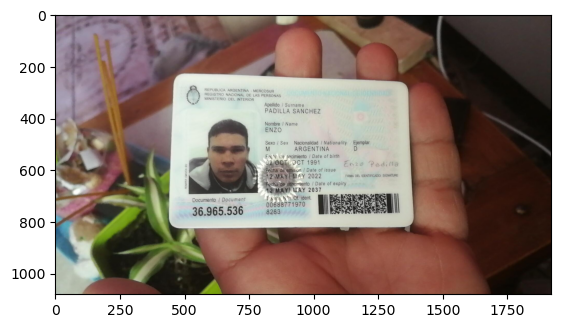

In [374]:
plt.imshow(res[0][0])

In [340]:
for i in df[1][0:10]:
    
    PIL_image = Image.fromarray(i.astype('uint8'), 'RGB')
    decoder = PDF417Decoder(PIL_image)
    
    if (len(decoder.decode()) > 0):
        decoded = decoder.barcode_data_index_to_string(0)
    print(decoded)

AttributeError: 'str' object has no attribute 'astype'

---

In [350]:
pip install pdf417decoder

Note: you may need to restart the kernel to use updated packages.


In [353]:
df[1][0]

'[[[ 10  10  10]\n[ 11  11  11]\n[ 11  11  11]\n...\n[202 170  87]\n[202 170  87]\n[202 170  87]]\n[[ 10  10  10]\n[ 11  11  11]\n[ 11  11  11]\n...\n[202 170  87]\n[202 170  87]\n[202 170  87]]\n[[ 11  11  11]\n[ 11  11  11]\n[ 12  12  12]\n...\n[202 170  87]\n[202 170  87]\n[202 170  87]]\n...\n[[202 203 198]\n[200 201 196]\n[198 199 194]\n...\n[155 156 151]\n[153 154 149]\n[152 153 148]]\n[[203 204 199]\n[201 202 197]\n[198 199 194]\n...\n[155 156 151]\n[153 154 149]\n[151 152 147]]\n[[204 205 200]\n[201 202 197]\n[197 198 193]\n...\n[154 155 150]\n[152 153 148]\n[151 152 147]]]'

In [354]:
.astype(int)

AttributeError: 'str' object has no attribute 'astype'

In [ ]:
im_pil = Image.fromarray(img)

In [ ]:
from PIL import Image as PIL
from pdf417decoder import PDF417Decoder

image = PIL.open("barcode.png")
decoder = PDF417Decoder(image)

if (decoder.decode() > 0):
    decoded = decoder.barcode_data_index_to_string(0)

---

In [ ]:
¿Cuántos documentos se pudo procesar?
¿Cuántos con m0 y cuántos con m1?
cuantos de los que no se pudo procesar con m0, sís e pudo procesar con m1?


In [391]:
len(df)

384

In [390]:
len(df.dni_bar.unique())

98

In [392]:
len(df.dni_trans.unique())

224

In [ ]:
'nan'

In [395]:
len(df[df['dni_trans']=='nan'])

24

In [431]:
fotos[5]

'imagen119.jpg'

Index([  0,   5,   7,  55,  71,  76, 123, 185, 202, 218, 225, 227, 238, 244,
       272, 273, 277, 290, 299, 331, 361, 363, 370, 380],
      dtype='int64')

In [442]:
len(df.dni_trans.unique())

224

In [446]:
df[df['dni_trans']!='nan']

,0,1,2,3,nro_tramite_bar,apellido_bar,nombre_bar,genero_bar,dni_bar,clase_bar,...,fecha_emision_bar,num_200_bar,apellido_trans,fecha_nac_trans,fecha_emision_trans,nombre_trans,dni_trans,apellido_sim,nombre_sim,dni_sim
1,imagen10.jpg,[[[123 101 122]\n[122 100 121]\n[122 100 121]\...,{},"{'apellido': ' PADILLA SANCHEZ', 'nombre': ' E...",nan,nan,nan,nan,nan,nan,...,nan,nan,PADILLA SANCHEZ,14 OCT/ OCT 1991,12 MAY/ MAY 202,ENZO,36965536,0.000000,0.000000,0.00
2,imagen100.jpg,[[[182 186 185]\n[182 186 185]\n[182 186 185]\...,"{'nro_tramite': '00362379469', 'apellido': 'MA...","{'apellido': ' MARTINEZ', 'nombre': ' CHRISTIA...",00362379469,MARTINEZ,CHRISTIAN ESTEBAN,M,29877755,A,...,24/04/2015,200,MARTINEZ,09 OCT/ OCT 1982,24 ABR/ APR,CHRISTIAN EEBAN,20877765,1.000000,0.937500,0.75
3,imagen11.jpg,[[[198 178 167]\n[197 177 166]\n[197 177 166]\...,"{'nro_tramite': '00546773049', 'apellido': 'ME...","{'apellido': ' MEDINA', 'nombre': ' JUAN RAMN'...",00546773049,MEDINA,JUAN RAMON,M,21365510,E,...,08/05/2018,209,MEDINA,23 MAR/ MAR 1970,08 MAY/ MAY 2018</s_fecha_emision>,JUAN RAMN,21365510,1.000000,0.947368,1.00
4,imagen113.jpg,[[[172 153 136]\n[171 152 135]\n[171 152 135]\...,{},"{'apellido': ' ROMERO', 'nombre': ' RAMON EDUA...",nan,nan,nan,nan,nan,nan,...,nan,nan,ROMERO,14 FEB/ FEB 1999,21 SEP/ SEP 20,RAMON EDUARDO,38887256,0.000000,0.000000,0.00
6,imagen120.jpg,[[[180 136 101]\n[178 134 99]\n[177 133 98]\...,"{'nro_tramite': '00340533078', 'apellido': 'HO...","{'apellido': ' HOESE GIMENES', 'nombre': ' CIN...",00340533078,HOESE GIMENEZ,CINTIA BELEN,F,33095367,A,...,05/02/2015,270,HOESE GIMENES,15 NOV/ NOV 1987,05 FEB/ FEB,CINTIA BELEN,33095367,0.923077,1.000000,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,imagen988.jpg,[[[ 99 93 81]\n[ 92 86 74]\n[ 91 83 70]\...,{},"{'apellido': ' EZEQUIEL', 'nombre': ' MARCOS S...",nan,nan,nan,nan,nan,nan,...,nan,nan,EZEQUIEL,25 JUL/ JUL 1999,15 NOV/ NOV,MARCOS SEPEL,55085980,0.000000,0.000000,0.00
379,imagen989.jpg,[[[ 2 0 1]\n[ 2 0 1]\n[ 2 0 1]\...,{},"{'apellido': ' GONZALEZ', 'nombre': ' MARIA DE...",nan,nan,nan,nan,nan,nan,...,nan,nan,GONZALEZ,02 ENE/ JAN 1975,25 OCT/ OCT 2,MARIA DEL CARMEN,24306857,0.000000,0.000000,0.00
381,imagen996.jpg,[[[205 211 211]\n[212 218 218]\n[219 225 225]\...,{},"{'apellido': ' VELAZQUEZ', 'nombre': ' REGINA ...",nan,nan,nan,nan,nan,nan,...,nan,nan,VELAZQUEZ,01 NOV/ NOV 1968,12 MAY/ MAY 2,REGINA NELLY,20182084,0.000000,0.000000,0.00
382,imagen997.jpg,[[[137 132 74]\n[138 133 75]\n[143 138 82]\...,{},"{'apellido': ' GRANELLO', 'nombre': ' KAREN SO...",nan,nan,nan,nan,nan,nan,...,nan,nan,GRANELLO,11 ENE/ JAN 1993,13 AGO/ AUG,KAREN SOLEDAD,37276527,0.000000,0.000000,0.00


## revisión de errores

In [447]:
# for i in df[df['dni_trans']=='nan']:
    
df[df['dni_trans']=='nan'][0].index

Index([  0,   5,   7,  55,  71,  76, 123, 185, 202, 218, 225, 227, 238, 244,
       272, 273, 277, 290, 299, 331, 361, 363, 370, 380],
      dtype='int64')

In [572]:
BarcodeModel(get_carnet(fotos_ls[380]))

{}

In [570]:
test = compute3(fotos_ls[380])
test

{'apellido': ' ANGELA',
 'nombre': ' MARCOS ALEJANDRO FERNANDO',
 'dni': ' 1992',
 'fecha_emision': '2016</s_fecha_emision>'}

In [575]:
test = compute3(get_carnet(fotos_ls[379]))
test

{'apellido': ' GONZALEZ',
 'nombre': ' MARIA DEL CARMEN',
 'dni': ' 24306857',
 'fecha_nac': ' 02 ENE/ JAN 1975',
 'fecha_emision': '28 OCT/ OCT 2'}

In [615]:
df[df.dni_bar!='nan'].apellido_sim.mean()

0.8804751419766681

In [618]:
df[df.dni_bar!='nan'].nombre_sim.mean()

0.9037277468783117

In [610]:
len(df[df.dni_trans!='nan'].dni_trans)#/381

360

In [571]:
test = compute3(get_carnet(fotos_ls[380]))
test

{'apellido': ' JUJUZ',
 'nombre': ' MARCOS ALEJANDRO',
 'dni': ' 31502742',
 'fecha_nac': ' 11 SEP/ SEP 1992',
 'fecha_emision': '14 JUN/ JUN'}

---

In [ ]:
331: proyección
calidad:
0,79,202,227, 238,244,272,
272, 273, 277, 361, 

se resuelven con get_carnet():
217 / 225 / 370
la iluminación de la imagen, posible falta de zoom:


238 // ==> sin calidad
244, 290,299 // ==> no compatible, dni dorso


In [581]:
+18/381

0.047244094488188976

In [578]:
len(df)

384

In [580]:
fallas_ls = [  0,   5,   7,  55,  71,  76, 123, 185, 202, 218, 225, 227, 238, 244,       272, 273, 277, 290, 299, 331, 361, 363, 370, 380]
len(fallas_ls)-6

18

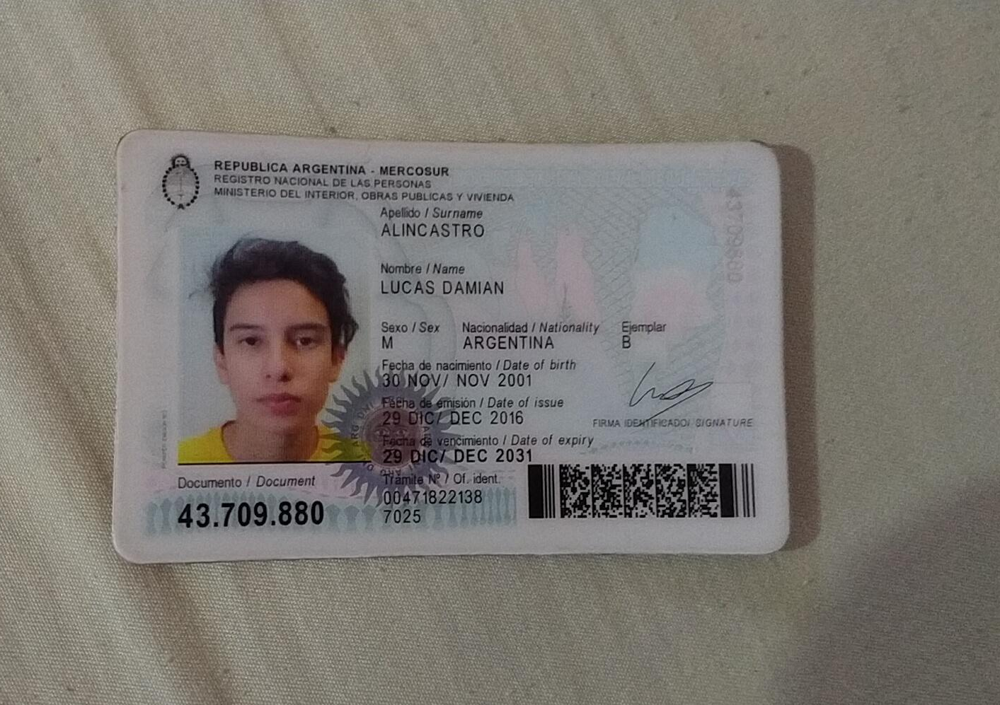

In [576]:
Image.fromarray(get_carnet(fotos_ls[378]))

In [559]:
compute3(get_carnet(fotos_ls[331]))

{'apellido': ' GAZIHUEZ',
 'nombre': ' NATALIA DANIEL',
 'dni': ' 27126552',
 'fecha_nac': ' 14 MAR/ MAR 1979',
 'fecha_emision': '14 MAR/ MAR 201'}

In [582]:
fallas_ls

[0,
 5,
 7,
 55,
 71,
 76,
 123,
 185,
 202,
 218,
 225,
 227,
 238,
 244,
 272,
 273,
 277,
 290,
 299,
 331,
 361,
 363,
 370,
 380]

<Axes: >

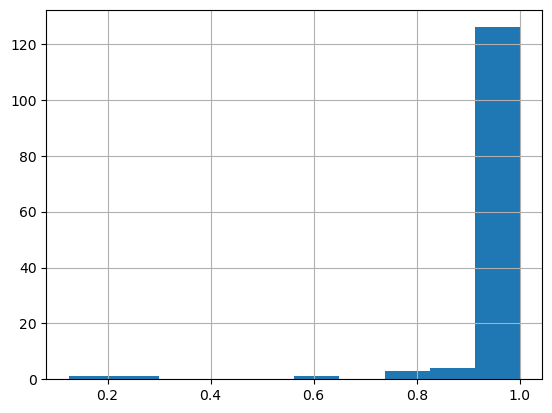

In [601]:
df[df.dni_bar !='nan'].dni_sim.hist()

In [594]:
df.dni_sim

0      1.00
1      0.00
2      0.75
3      1.00
4      0.00
       ... 
379    0.00
380    1.00
381    0.00
382    0.00
383    1.00
Name: dni_sim, Length: 384, dtype: float64

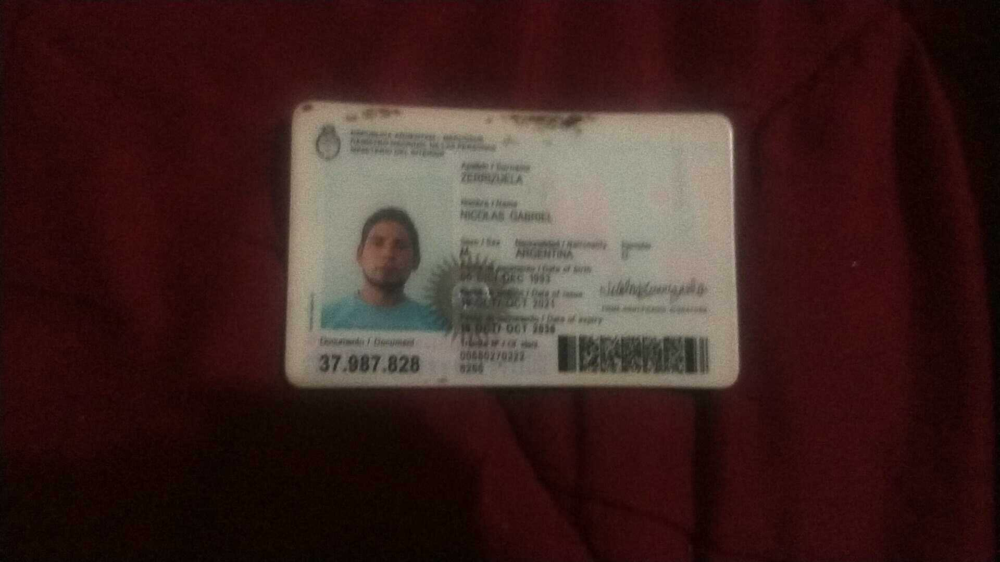

In [591]:
alpha = 10
beta = 2
image = fotos_ls[202]
test = cv2.convertScaleAbs(image, alpha, beta)
Image.fromarray(test)

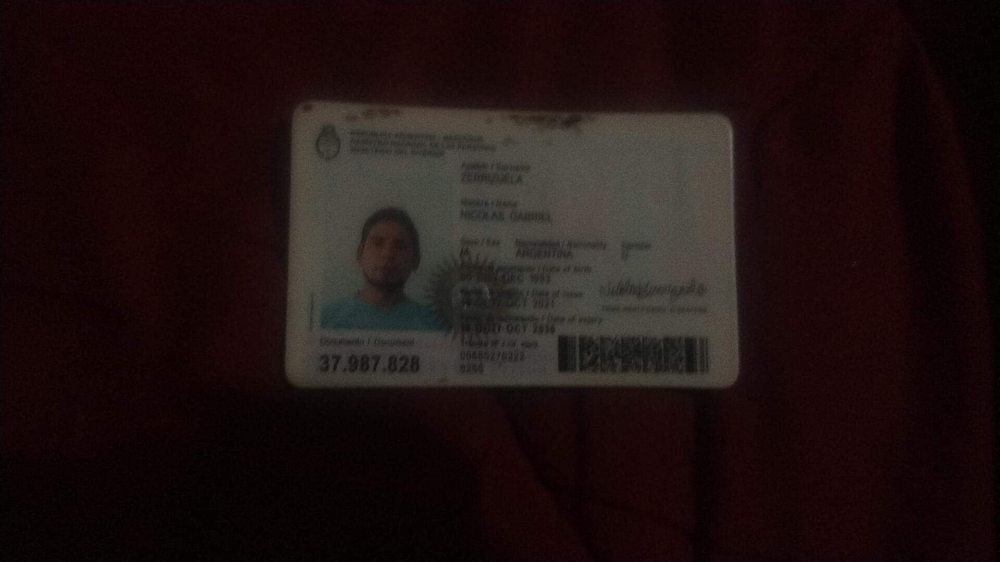

In [585]:
Image.fromarray(fotos_ls[202])

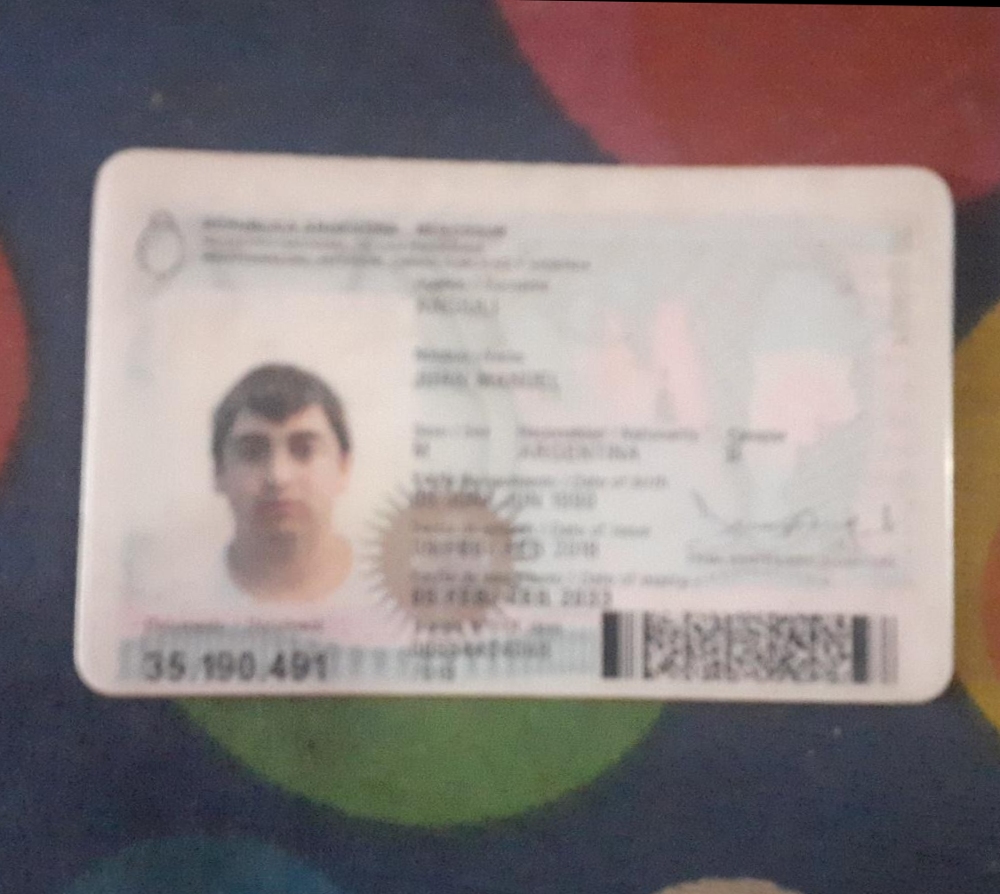

In [546]:
Image.fromarray(get_carnet(rotacion_fina(fotos_ls[238])))

In [534]:
# plt.imshow(get_carnet(rotacion_fina(fotos_ls[227]))).size

In [518]:
Image.fromarray(rotacion_fina(get_carnet(rotacion_fina(fotos_ls[227]))))

error: OpenCV(4.7.0) D:\bld\libopencv_1678824269560\work\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


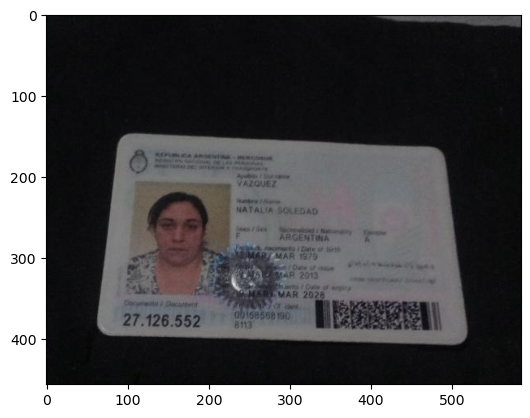

In [497]:
plt.imshow(get_carnet(fotos_ls[331]))

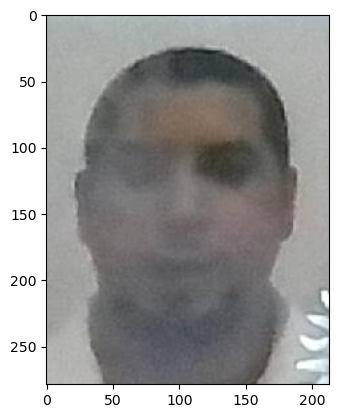

In [487]:
plt.imshow(get_face(fotos_ls[76]))

In [489]:
fotos[76]

'imagen287.jpg'

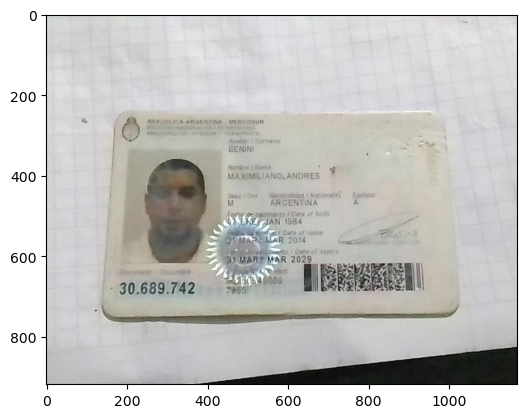

In [493]:
plt.imshow(get_carnet(fotos_ls[79]))

In [494]:
test = compute3(get_carnet(fotos_ls[79]))
test

{'apellido': ' GENINI',
 'nombre': ' MAXIMILIANO ANDRES',
 'dni': ' 30689742',
 'fecha_nac': ' 01 ENE/ JAN 1984',
 'fecha_emision': '31 MAR/ MAR 20'}

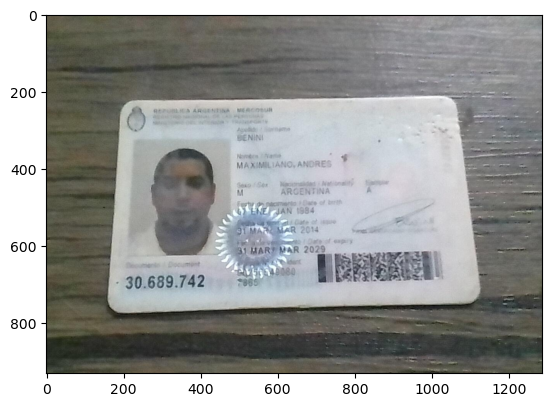

In [486]:
plt.imshow(get_carnet(fotos_ls[76]))

In [485]:
test = compute3(get_carnet(fotos_ls[76]))
test

{'apellido': ' BENINI',
 'nombre': ' MAXIMILIANO ANDRE',
 'dni': ' 30689742',
 'fecha_nac': ' 01 ENE/ JAN 1994',
 'fecha_emision': '31 MAR/ MAR 20'}

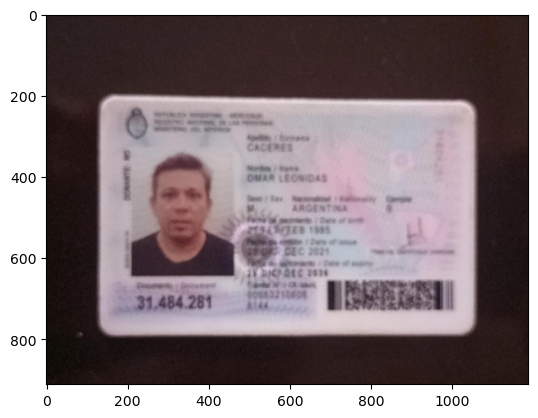

In [483]:
plt.imshow(get_carnet(fotos_ls[71]))

In [484]:
# para imágenes de baja calidad me trae fruta....
test = compute3(get_carnet(fotos_ls[71]))
test

{'apellido': ' CASTAGNO',
 'nombre': ' OMAR LECTOR',
 'dni': ' 31404281',
 'fecha_nac': ' 23 ABR/ APR 1994',
 'fecha_emision': '11 SEP/ SEP 20'}

In [481]:
test = compute3(fotos_ls[55])
test

{'apellido': ' SEPAL 990', 'fecha_nac': '25 JUL/ JUL 2019</s_fecha_emision>'}

In [476]:
test = compute3(get_carnet(fotos_ls[55]))
test

error: OpenCV(4.7.0) D:\bld\libopencv_1678824269560\work\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [475]:
test = compute3(get_carnet(fotos_ls[7]))
test

{'apellido': ' JILISES MARCELO',
 'dni': ' 37708967',
 'fecha_nac': ' 11 DIC/ DEC 1993',
 'fecha_emision': '01 SEP/'}

In [472]:
test = compute3(get_carnet(fotos_ls[5]))
test

{'apellido': ' CERUTTI',
 'nombre': ' JLIBES MARCELO',
 'dni': ' 37708967',
 'fecha_nac': ' 11 DIC/ DEC 1993',
 'fecha_emision': '01 SEP/ SEP 2'}

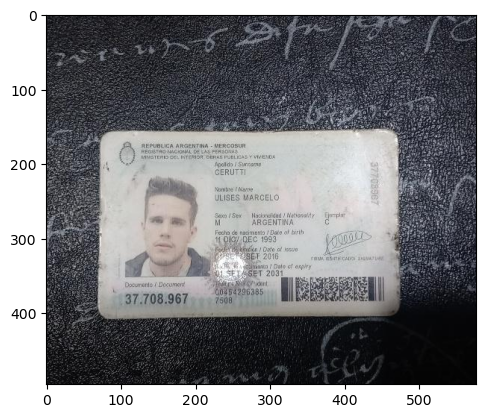

In [454]:
plt.imshow(get_carnet(fotos_ls[5]))

In [648]:
test = '09 OCT/ OCT 1982'
test

'09 OCT/ OCT 1982'

In [656]:
mapeo_meses = {
'01':' ENE/ JAN ',
'02':' FEB/ FEB ',
'03':' MAR/ MAR ',
'04':' ABR/ APR ',
'05':' MAY/ MAY ',
'06':' JUN/ JUN ',
'07':' JUL/ JUL ',
'08':' AGO/ AUG ',
'09':' SEP/ SEP ',
'10':' OCT/ OCT ',
'11':' NOV/ NOV ',
'12':' DIC/ DEC '
}

def fecha_dni(fecha):
    dia,mes,año = fecha.split('/')
    nuevo_mes = mapeo_meses[mes]
    nueva_fecha = dia + nuevo_mes + año
    return nueva_fecha

mapeo_meses_rev = {v: f'/{k}/' for k,v in mapeo_meses.items()}

def fecha_dni_rev(fecha_dni):
    for k,v in mapeo_meses_rev.items():
        fecha_dni = fecha_dni.replace(k, v)
    return fecha_dni
# test = df.fecha_nac[0]
# fecha_dni(test)

In [660]:
df['fecha_nac_bar2']

0             nan
1             nan
2      09/10/1982
3      23/03/1970
4             nan
          ...    
379           nan
380           nan
381           nan
382           nan
383    17/11/1984
Name: fecha_nac_bar, Length: 384, dtype: object

In [665]:
df.fecha_nac_trans[2]

'09 OCT/ OCT 1982'

In [664]:
fecha_dni(df.fecha_nac_bar[2])

'09 OCT/ OCT 1982'

In [658]:
[fecha_dni_rev(i) if i != 'nan' else 'nan' for i in df.fecha_nac_trans.tolist()]

['14/07/1999',
 '14/10/1991',
 '09/10/1982',
 '23/03/1970',
 '14/02/1999',
 '27/01/1967',
 '15/11/1987',
 '01/12/1999',
 'nan',
 '13/03/1999',
 '11/01/1994',
 '13/03/1999',
 '03/04/1992',
 '12/09/1977',
 '03/12/1984',
 '25/09/1996',
 '09/12/2000',
 '20/09/2011',
 '10/09/1981',
 '19/03/1983',
 '11/10/1972',
 '18/04/1998',
 '01/09/1995',
 '01/05/1995',
 '20/12/1983',
 '14/07/1997',
 '08/01/1987',
 '21/02/1992',
 '28/06/1971',
 '24/02/1992',
 '03/04/1971',
 '11/07/1972',
 '14/08/1999',
 '01/02/1992',
 '01/04/2002',
 '14/07/1967',
 '24/04/1999',
 '28/11/1994',
 '19/08/1977',
 '11/10/2003',
 '17/08/1977',
 '23/08/1995',
 '12/08/2000',
 '08/07/1982',
 '02/10/2003',
 '03/04/1971',
 '01/02/1992',
 '20/11/1994',
 '20/05/2019',
 '23/04/1972',
 '11/05/1986',
 '23/06/2001',
 '18/04/1991',
 '27/08/1974',
 '18/02/1995',
 '25/07/2019</s_fecha_emision>',
 '18/10/1971',
 '03/04/1971',
 '28/02/1995',
 '24/10/1972',
 '24/08/1963',
 '20/12/1983',
 '13/07/1992',
 '20/11/2012',
 '14/02/1994',
 '27/10/1996',

In [657]:
[fecha_dni_rev(fecha_dni(i)) if i != 'nan' else 'nan' for i in df.fecha_nac_bar.tolist()]

['nan',
 'nan',
 '09/10/1982',
 '23/03/1970',
 'nan',
 'nan',
 '15/11/1987',
 'nan',
 'nan',
 '19/03/1999',
 'nan',
 '19/03/1999',
 '03/04/1992',
 'nan',
 '03/12/1984',
 '25/09/1996',
 '09/12/2000',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '01/09/1995',
 '01/05/1998',
 '26/12/1983',
 'nan',
 '09/01/1987',
 'nan',
 'nan',
 'nan',
 '03/04/1971',
 '28/07/1972',
 'nan',
 'nan',
 '01/04/2002',
 'nan',
 'nan',
 'nan',
 '28/07/1972',
 'nan',
 'nan',
 '01/05/1998',
 'nan',
 '06/07/1982',
 '02/10/2003',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '29/06/2001',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '24/08/1963',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '17/09/1979',
 '17/12/1952',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '20/11/1989',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '03/02/2004',
 '07/01/1984',
 'nan',
 'nan',
 '31/07/1972',
 '05/01/1998',
 'nan',
 'nan',
 '01/01/2001',
 'nan',
 'nan',
 'nan'

In [626]:
df.fecha_nac_bar.tolist()#.remove('nan')

['nan',
 'nan',
 '09/10/1982',
 '23/03/1970',
 'nan',
 'nan',
 '15/11/1987',
 'nan',
 'nan',
 '19/03/1999',
 'nan',
 '19/03/1999',
 '03/04/1992',
 'nan',
 '03/12/1984',
 '25/09/1996',
 '09/12/2000',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '01/09/1995',
 '01/05/1998',
 '26/12/1983',
 'nan',
 '09/01/1987',
 'nan',
 'nan',
 'nan',
 '03/04/1971',
 '28/07/1972',
 'nan',
 'nan',
 '01/04/2002',
 'nan',
 'nan',
 'nan',
 '28/07/1972',
 'nan',
 'nan',
 '01/05/1998',
 'nan',
 '06/07/1982',
 '02/10/2003',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '29/06/2001',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '24/08/1963',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '17/09/1979',
 '17/12/1952',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '20/11/1989',
 'nan',
 'nan',
 'nan',
 'nan',
 'nan',
 '03/02/2004',
 '07/01/1984',
 'nan',
 'nan',
 '31/07/1972',
 '05/01/1998',
 'nan',
 'nan',
 '01/01/2001',
 'nan',
 'nan',
 'nan'

---

# PERFORMANCE METRICS

In [2]:
df = pd.read_pickle('df.pkl')

In [ ]:
from nltk.metrics import *

In [13]:
ref = df[df.dni_bar!='nan'].dni_bar.tolist()
test = df[df.dni_bar!='nan'].dni_trans.tolist()
print(accuracy(ref, test))
print(precision(set(ref),set(test)))
print(recall(set(ref),set(test)))
print(f_measure(set(ref),set(test)))

0.9191176470588235
0.8952380952380953
0.9690721649484536
0.9306930693069309


In [15]:
ref = df[df.dni_bar!='nan'].apellido_bar.tolist()
test = df[df.dni_bar!='nan'].apellido_trans.tolist()
print(accuracy(ref, test))
print(precision(set(ref),set(test)))
print(recall(set(ref),set(test)))
print(f_measure(set(ref),set(test)))

0.6544117647058824
0.5794392523364486
0.6595744680851063
0.6169154228855721


In [16]:
ref = df[df.dni_bar!='nan'].nombre_bar.tolist()
test = df[df.dni_bar!='nan'].nombre_trans.tolist()
print(accuracy(ref, test))
print(precision(set(ref),set(test)))
print(recall(set(ref),set(test)))
print(f_measure(set(ref),set(test)))

0.6544117647058824
0.631578947368421
0.7422680412371134
0.6824644549763034


In [23]:
+.35+.65*

0.7725

In [60]:
def metricas(ref,test,p=0):
    
    if type(ref) == pd.Series:
            ref = ref.tolist()
    
    if type(test) == pd.Series:
            test = test.tolist()
    
    acc =  accuracy(ref, test)
    prec = precision(set(ref),set(test))
    rec = recall(set(ref),set(test))
    f_m = f_measure(set(ref),set(test))

    temp = [acc,prec,rec,f_m]
    temp = [np.round(i*100,2) for i in temp]
    temp = dict(zip('acc,prec,rec,f_m'.split(','),temp))
    if p > 0:
        temp = {k: np.round(p*100+ (1-p)*v,2) for k,v in temp.items()}
    return temp

In [62]:
 metricas(df[df.dni_bar!='nan'].dni_bar,df[df.dni_bar!='nan'].dni_trans,.35)

{'acc': 94.74, 'prec': 93.19, 'rec': 97.99, 'f_m': 95.5}

In [65]:
 metricas(df[df.dni_bar!='nan'].apellido_bar,df[df.apellido_bar!='nan'].apellido_trans,.35)

{'acc': 77.54, 'prec': 72.66, 'rec': 77.87, 'f_m': 75.1}

In [66]:
 metricas(df[df.dni_bar!='nan'].nombre_bar,df[df.apellido_bar!='nan'].nombre_trans,.35)

{'acc': 77.54, 'prec': 76.05, 'rec': 83.25, 'f_m': 79.36}

In [39]:
metricas(df[df.dni_bar!='nan'].dni_bar,df[df.dni_bar!='nan'].dni_trans)

['acc', 'prec', 'rec', 'f_m']

In [43]:
test = metricas(df[df.dni_bar!='nan'].dni_bar,df[df.dni_bar!='nan'].dni_trans)
test.items()

In [50]:
test = metricas(df[df.dni_bar!='nan'].apellido_bar,df[df.dni_bar!='nan'].apellido_trans)
test

{'acc': 65.44, 'prec': 57.94, 'rec': 65.96, 'f_m': 61.69}

---

{'acc': 77.536, 'prec': 72.661, 'rec': 77.874, 'f_m': 75.0985}

In [27]:

adj_metrics = [ 0.35+0.65*i for i in metricas(ref,test)]
adj_metrics

[0.7466911764705882, 0.7060869565217391, 0.7765625, 0.7381516587677724]

---

In [22]:
df[3][0]

"{'apellido': ' 1425776', 'fecha_nac': ' 14 JUL/ JUL 1999', 'fecha_emision': '14 ENE/ JAN 2019</s_fecha_emision>'}"

In [68]:
ref = df[df.dni_bar!='nan'].dni_bar.tolist()
test = df[df.dni_bar!='nan'].dni_trans.tolist()
print(accuracy(ref, test))
print(precision(set(ref),set(test)))
print(recall(set(ref),set(test)))
print(f_measure(set(ref),set(test)))

0.9191176470588235
0.8952380952380953
0.9690721649484536
0.9306930693069309


In [69]:
cm = ConfusionMatrix(ref, test)

In [104]:
for q,i in enumerate(list(zip(ref,test))):
    if len(i[0])==len(i[1]):
        pass
    else:
        print(q,i[0],i[1])

74 13634621 3383888
125 24306857 243068857


In [109]:
len(ref[74]),len(test[74]), len(ref[125]),len(test[125])

(8, 7, 8, 9)

In [106]:
list(zip(ref,test))[125]

('24306857', '243068857')

In [121]:
r_ =[]
t_ = []
for r,t in zip(ref,test):
    if len(r)!=len(t):
        if len(r)>len(t):
            t = t +'x'
        elif len(t)>len(r):
            r = r + 'x'
    r_.append(r)
    t_.append(t)

In [123]:
for q,i in enumerate(list(zip(r_,t_))):
    if len(i[0])==len(i[1]):
        pass
    else:
        print(q,i[0],i[1])

In [124]:
ref_char = list(''.join(r_))
test_char = list(''.join(t_))

In [125]:
cm = ConfusionMatrix(ref_char, test_char)

In [126]:
print(cm.pretty_format(sort_by_count=False))

  |   0   1   2   3   4   5   6   7   8   9   x |
--+---------------------------------------------+
0 |<103>  .   .   .   .   .   1   .   .   .   . |
1 |   .<114>  .   2   1   .   .   .   1   .   1 |
2 |   .   1<148>  1   .   .   .   1   1   .   . |
3 |   .   .   .<115>  1   .   2   .   .   .   . |
4 |   1   .   1   .<122>  .   .   .   1   .   . |
5 |   .   .   .   1   . <76>  1   .   1   .   . |
6 |   1   .   .   1   .   1<106>  .   3   .   . |
7 |   .   1   .   .   .   1   . <86>  .   .   . |
8 |   .   .   .   1   .   .   .   . <94>  .   . |
9 |   1   .   .   2   .   .   .   .   1 <92>  . |
x |   .   .   .   .   .   .   .   1   .   .  <.>|
--+---------------------------------------------+
(row = reference; col = test)



In [127]:
def s(num):
    return int(np.round(num*100,0))
for i in range(10):
    num = str(i)
    print(num, s(cm.recall(num)) , s(cm.precision(num))  , s(cm.f_measure(num)))

0 99 97 98
1 96 98 97
2 97 99 98
3 97 93 95
4 98 98 98
5 96 97 97
6 95 96 95
7 98 98 98
8 99 92 95
9 96 100 98


In [84]:
print(cm.pretty_format(sort_by_count=False,values_in_chart=False))

   |                             1 |
   |  1  2  3  4  5  6  7  8  9  0 |
---+-------------------------------+
 1 |<69> 4  2  5  7  1  3  4  7  2 |
 2 |  8<72> 6  8  7  1  5  7  1  4 |
 3 |  3 13<90> 8  8  3  7  9  6  5 |
 4 |  2  1  8<81> 6  2  5  3  3  7 |
 5 |  5  5 11  5<76>10  7  3  2  1 |
 6 |  6  .  3  2  3<51> 3  .  8  3 |
 7 |  3  3 10  8  2  2<72> 2  5  5 |
 8 |  1  4  9  2  7  3  3<52> 4  3 |
 9 |  4  5  6  2  3  2  3  8<62> . |
10 |  5  9  4  2  5  3  2  .  4<62>|
---+-------------------------------+
(row = reference; col = test)
Value key:
     1: 0
     2: 1
     3: 2
     4: 3
     5: 4
     6: 5
     7: 6
     8: 7
     9: 8
    10: 9



In [689]:
# list(zip(df[df.dni_bar!='nan'].dni_bar,df[df.dni_bar!='nan'].dni_trans))

In [691]:
prediction = df[df.dni_bar!='nan'].dni_bar.tolist()
ground_truth = df[df.dni_bar!='nan'].dni_trans.tolist()
muc.evaluate_one(prediction, grount_truth)

TypeError: evaluate_one() missing 1 required positional argument: 'text'

In [693]:
import eval4ner

In [679]:
import eval4ner.muc as muc
import pprint
grount_truth = [('PER', 'John Jones'), ('PER', 'Peter Peters'), ('LOC', 'York')]
prediction = [('PER', 'John Jones and Peter Peters came to York')]
text = 'John Jones and Peter Peters came to York'
one_result = muc.evaluate_one(prediction, grount_truth, text)
pprint.pprint(one_result)

{'exact': {'actual': 1,
           'correct': 0,
           'f1_score': 0,
           'incorrect': 1,
           'missed': 2,
           'partial': 0,
           'possible': 3,
           'precision': 0.0,
           'recall': 0.0,
           'spurius': 0},
 'partial': {'actual': 1,
             'correct': 0,
             'f1_score': 0.25,
             'incorrect': 0,
             'missed': 2,
             'partial': 1,
             'possible': 3,
             'precision': 0.5,
             'recall': 0.16666666666666666,
             'spurius': 0},
 'strict': {'actual': 1,
            'correct': 0,
            'f1_score': 0,
            'incorrect': 1,
            'missed': 2,
            'partial': 0,
            'possible': 3,
            'precision': 0.0,
            'recall': 0.0,
            'spurius': 0},
 'type': {'actual': 1,
          'correct': 1,
          'f1_score': 0.5,
          'incorrect': 0,
          'missed': 2,
          'partial': 0,
          'possible': 3,
     

In [ ]:
prediction = df[df.dni_bar!='nan'].dni_bar.tolist()
ground_truth = df[df.dni_bar!='nan'].dni_trans.tolist()
muc.evaluate_one(prediction, grount_truth)

In [697]:
from rouge import Rouge

In [698]:
model_out = "he began by starting a five person war cabinet and included chamberlain as lord president of the council"

reference = "he began his premiership by forming a five-man war cabinet which included chamberlain as lord president of the council"
rouge = Rouge()
rouge.get_scores(model_out, reference)

[{'rouge-1': {'r': 0.7368421052631579,
   'p': 0.7777777777777778,
   'f': 0.7567567517604091},
  'rouge-2': {'r': 0.5, 'p': 0.5294117647058824, 'f': 0.514285709289796},
  'rouge-l': {'r': 0.7368421052631579,
   'p': 0.7777777777777778,
   'f': 0.7567567517604091}}]

In [ ]:
rouge.get_

In [708]:

rouge.get_scores(model_out, model_out)

[{'rouge-1': {'r': 1.0, 'p': 1.0, 'f': 0.999999995},
  'rouge-2': {'r': 1.0, 'p': 1.0, 'f': 0.999999995},
  'rouge-l': {'r': 1.0, 'p': 1.0, 'f': 0.999999995}}]

In [706]:
ground_truth,prediction

('29877755', '20877765')

In [707]:
ground_truth = df[df.dni_bar!='nan'].dni_bar.tolist()[0]
prediction = df[df.dni_bar!='nan'].dni_trans.tolist()[0]
rouge.get_scores(prediction, ground_truth)

[{'rouge-1': {'r': 0.0, 'p': 0.0, 'f': 0.0},
  'rouge-2': {'r': 0.0, 'p': 0.0, 'f': 0.0},
  'rouge-l': {'r': 0.0, 'p': 0.0, 'f': 0.0}}]

In [ ]:
prediction = df[df.dni_bar!='nan'].dni_bar.tolist()
ground_truth = df[df.dni_bar!='nan'].dni_trans.tolist()